### 实验一：数字图像空域增强实验

#### 作业一：彩色图像的直方图均衡化
以左图为输入，实现直方图均衡化的算法，获得类似右图的效果。实验用图像自行选择。

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import sys
import io
from scipy import signal
import cv2
import os
from os import listdir
import re
from itertools import groupby

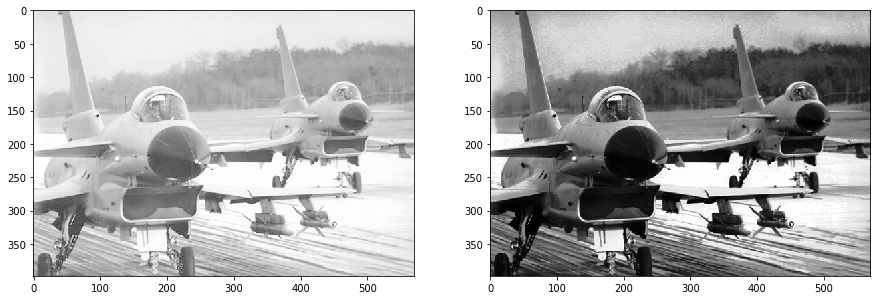

In [2]:
img = cv2.imread('43.bmp', 0)
equ = cv2.equalizeHist(img)
plt.figure(figsize=(15,15))
plt.subplot(1, 2, 1)
plt.imshow(img,cmap = 'gray')
plt.subplot(1, 2, 2)
plt.imshow(equ,cmap = 'gray')
plt.show()

#### 问题1：提取RGB三个通道图像，计算其平均直方图结果，然后再进行均衡化；


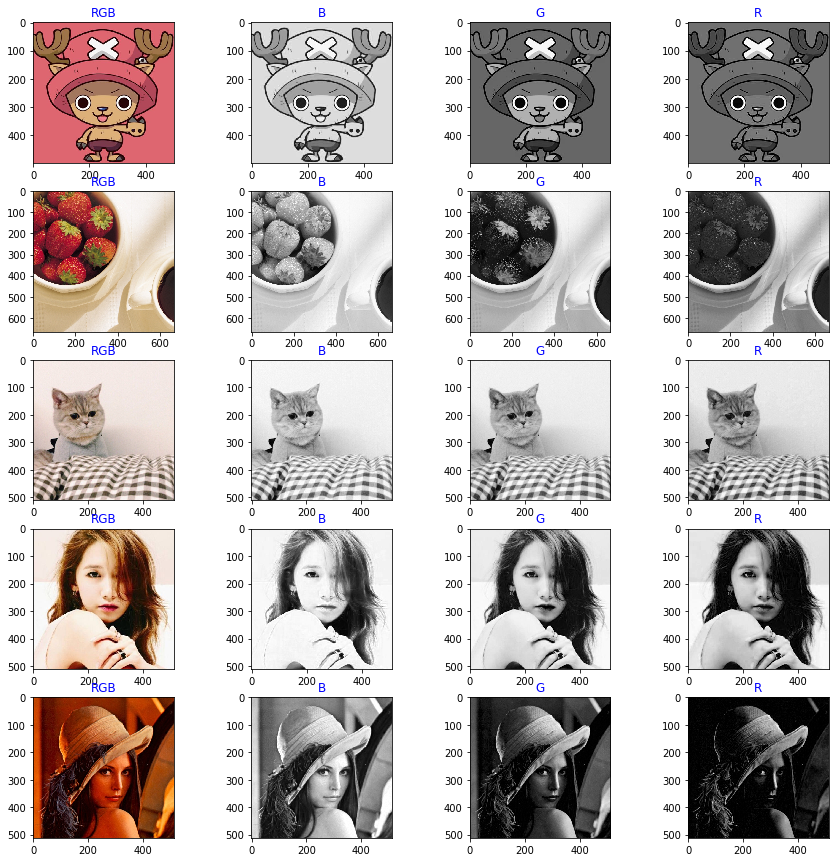

In [3]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["RGB","B","G","R"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]] 
    b,g,r = cv2.split(img_2)
    images = [img_2,b,g,r]
    for j,img in enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()   

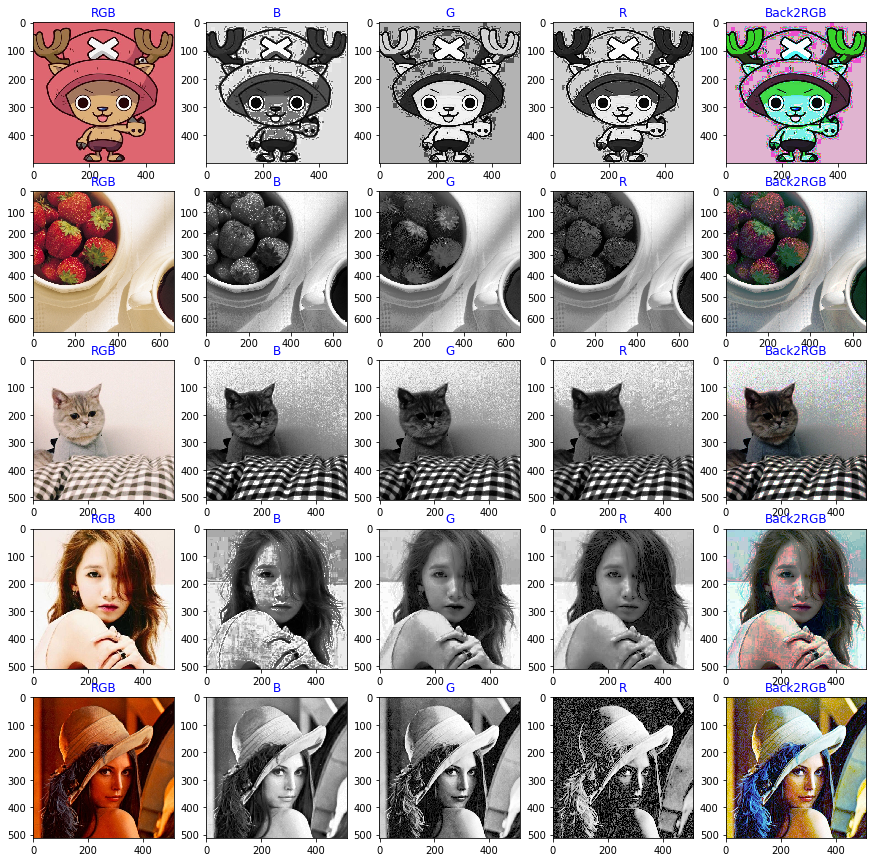

In [4]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["RGB","B","G","R","Back2RGB"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]] 
    b,g,r = cv2.split(img_2)
    bequ = cv2.equalizeHist(b)
    gequ = cv2.equalizeHist(g)
    requ = cv2.equalizeHist(r)
    imgequ = cv2.merge((bequ, gequ, requ))
    images = [img_2,bequ, gequ, requ,imgequ]
    for j, img in  enumerate(images):
        plt.subplot(5, 5, 1 + i * 5 + j)
        plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()

#### 问题2：RGB空转为HSI空间图像，对 I（亮度，Intensity）通道进行直方图均衡化，再转为RGB图像。

In [5]:
def rgb2hsi(rgb_img):
    """
    这是将RGB彩色图像转化为HSI图像的函数
    :param rgm_img: RGB彩色图像
    :return: HSI图像
    """
    #保存原始图像的行列数
    row = np.shape(rgb_img)[0]
    col = np.shape(rgb_img)[1]
    #对原始图像进行复制
    hsi_img = rgb_img.copy()
    #对图像进行通道拆分
    B,G,R = cv2.split(rgb_img)
    #把通道归一化到[0,1]
    [B,G,R] = [ i/ 255.0 for i in ([B,G,R])]
    H = np.zeros((row, col))    #定义H通道
    I = (R + G + B) / 3.0       #计算I通道
    S = np.zeros((row,col))      #定义S通道
    for i in range(row):
        den = np.sqrt((R[i]-G[i])**2+(R[i]-B[i])*(G[i]-B[i]))
        thetha = np.arccos(0.5*(R[i]-B[i]+R[i]-G[i])/den)   #计算夹角
        h = np.zeros(col)               #定义临时数组
        #den>0且G>=B的元素h赋值为thetha
        h[B[i]<=G[i]] = thetha[B[i]<=G[i]]
        #den>0且G<=B的元素h赋值为thetha
        h[G[i]<B[i]] = 2*np.pi-thetha[G[i]<B[i]]
        #den<0的元素h赋值为0
        h[den == 0] = 0
        H[i] = h/(2*np.pi)      #弧度化后赋值给H通道
    #计算S通道
    for i in range(row):
        min = []
        #找出每组RGB值的最小值
        for j in range(col):
            arr = [B[i][j],G[i][j],R[i][j]]
            min.append(np.min(arr))
        min = np.array(min)
        #计算S通道
        S[i] = 1 - min*3/(R[i]+B[i]+G[i])
        #I为0的值直接赋值0
        S[i][R[i]+B[i]+G[i] == 0] = 0
    #扩充到255以方便显示，一般H分量在[0,2pi]之间，S和I在[0,1]之间
    hsi_img[:,:,0] = H*255
    hsi_img[:,:,1] = S*255
    hsi_img[:,:,2] = I*255
    return hsi_img

def hsi2rgb(hsi_img):
    """
    这是将HSI图像转化为RGB图像的函数
    :param hsi_img: HSI彩色图像
    :return: RGB图像
    """
    # 保存原始图像的行列数
    row = np.shape(hsi_img)[0]
    col = np.shape(hsi_img)[1]
    #对原始图像进行复制
    rgb_img = hsi_img.copy()
    #对图像进行通道拆分
    H,S,I = cv2.split(hsi_img)
    #把通道归一化到[0,1]
    [H,S,I] = [ i/ 255.0 for i in ([H,S,I])]
    R,G,B = H,S,I
    for i in range(row):
        h = H[i]*2*np.pi
        #H大于等于0小于120度时
        a1 = h >=0
        a2 = h < 2*np.pi/3
        a = a1 & a2         #第一种情况的花式索引
        tmp = np.cos(np.pi / 3 - h)
        b = I[i] * (1 - S[i])
        r = I[i]*(1+S[i]*np.cos(h)/tmp)
        g = 3*I[i]-r-b
        B[i][a] = b[a]
        R[i][a] = r[a]
        G[i][a] = g[a]
        #H大于等于120度小于240度
        a1 = h >= 2*np.pi/3
        a2 = h < 4*np.pi/3
        a = a1 & a2         #第二种情况的花式索引
        tmp = np.cos(np.pi - h)
        r = I[i] * (1 - S[i])
        g = I[i]*(1+S[i]*np.cos(h-2*np.pi/3)/tmp)
        b = 3 * I[i] - r - g
        R[i][a] = r[a]
        G[i][a] = g[a]
        B[i][a] = b[a]
        #H大于等于240度小于360度
        a1 = h >= 4 * np.pi / 3
        a2 = h < 2 * np.pi
        a = a1 & a2             #第三种情况的花式索引
        tmp = np.cos(5 * np.pi / 3 - h)
        g = I[i] * (1-S[i])
        b = I[i]*(1+S[i]*np.cos(h-4*np.pi/3)/tmp)
        r = 3 * I[i] - g - b
        B[i][a] = b[a]
        G[i][a] = g[a]
        R[i][a] = r[a]
    rgb_img[:,:,0] = B*255
    rgb_img[:,:,1] = G*255
    rgb_img[:,:,2] = R*255
    return rgb_img

In [6]:
r2h_i = rgb2hsi(img_2)

D:\les\ide\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\les\ide\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


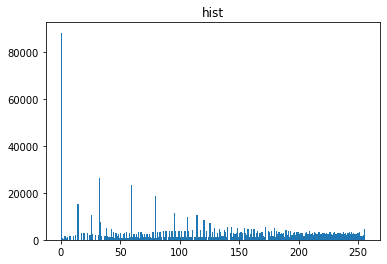

In [7]:
Intensity = r2h_i[:,:,2]

hist = np.bincount(Intensity.ravel(), minlength=256)#直方图
# plt.subplot(1, 2, 2)
plt.hist(img.ravel(), 256, [0, 256])
plt.title("hist")
Intensityequ = cv2.equalizeHist(Intensity)

backHSI = cv2.merge((r2h_i[:,:,0], r2h_i[:,:,1], Intensityequ))
backRGB = hsi2rgb(backHSI)

D:\les\ide\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\les\ide\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


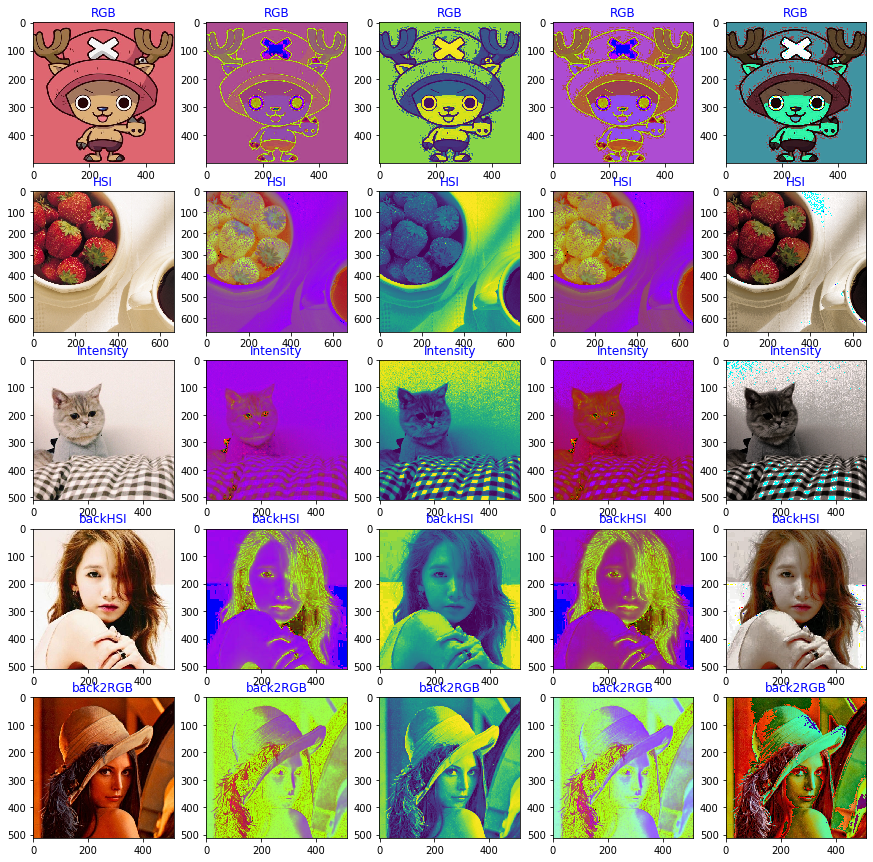

In [8]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["RGB","HSI","Intensity","backHSI","back2RGB"]
plt.figure(figsize=(15,15))
for i,element in enumerate(image):
    images = []
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]]
    images.append(img_2)
    
    r2h_i = rgb2hsi(img_2)
    images.append(r2h_i)
    
    Intensity = r2h_i[:,:,2]
    hist = np.bincount(Intensity.ravel(), minlength=256)#直方图
    # plt.subplot(1, 2, 2)
#     plt.hist(img.ravel(), 256, [0, 256])
#     plt.title("hist")
    Intensityequ = cv2.equalizeHist(Intensity)
    images.append(Intensityequ)
    
    backHSI = cv2.merge((r2h_i[:,:,0], r2h_i[:,:,1], Intensityequ))
    images.append(backHSI)
    
    backRGB = hsi2rgb(backHSI)
    images.append(backRGB)
    
    for j, img in enumerate(images):
        plt.subplot(5, 5, 1 + i*5 + j)
        plt.imshow(img)
        plt.title(stage[i],color='blue')
plt.show()   

#### 作业二：彩色图像的去噪

##### 问题1：对一副彩色图像分别添加高斯噪声和椒盐噪声，输出结果图像； 

In [9]:
def sp_noise(image,prob):
    '''
    添加椒盐噪声
    prob:噪声比例 
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

def gasuss_noise(image, mean=0, var=0.001):
    ''' 
        添加高斯噪声
        mean : 均值 
        var : 方差
    '''
    image = np.array(image/255, dtype=float)
    noise = np.random.normal(mean, var ** 0.5, image.shape)
    out = image + noise
    if out.min() < 0:
        low_clip = -1.
    else:
        low_clip = 0.
    out = np.clip(out, low_clip, 1.0)
    out = np.uint8(out*255)
    return out

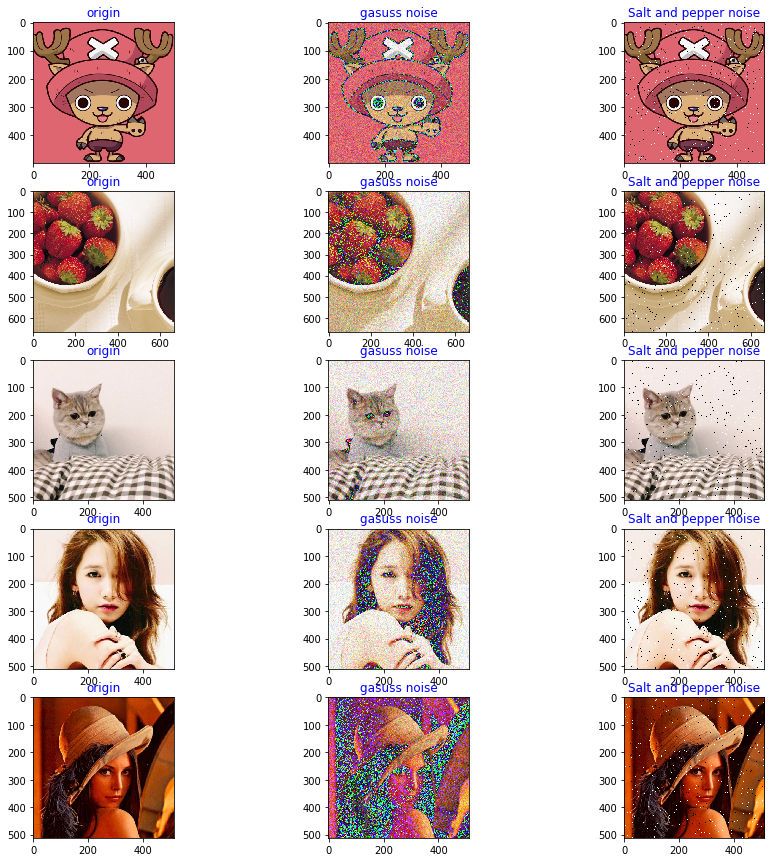

In [10]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["origin","gasuss noise","Salt and pepper noise"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]]
    gasuss = gasuss_noise(img_2,var=0.01)
    Salt = sp_noise(img_2,0.01)
    images = [img_2,gasuss, Salt]
    for j, img in  enumerate(images):
        plt.subplot(len(image), 3, 1 + i * 3 + j)
        plt.imshow(img)
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题2：采用K-NN均值滤波对二种噪声图像进行去噪，测试3组不同的参数，输出结果图像，并分析实验效果；

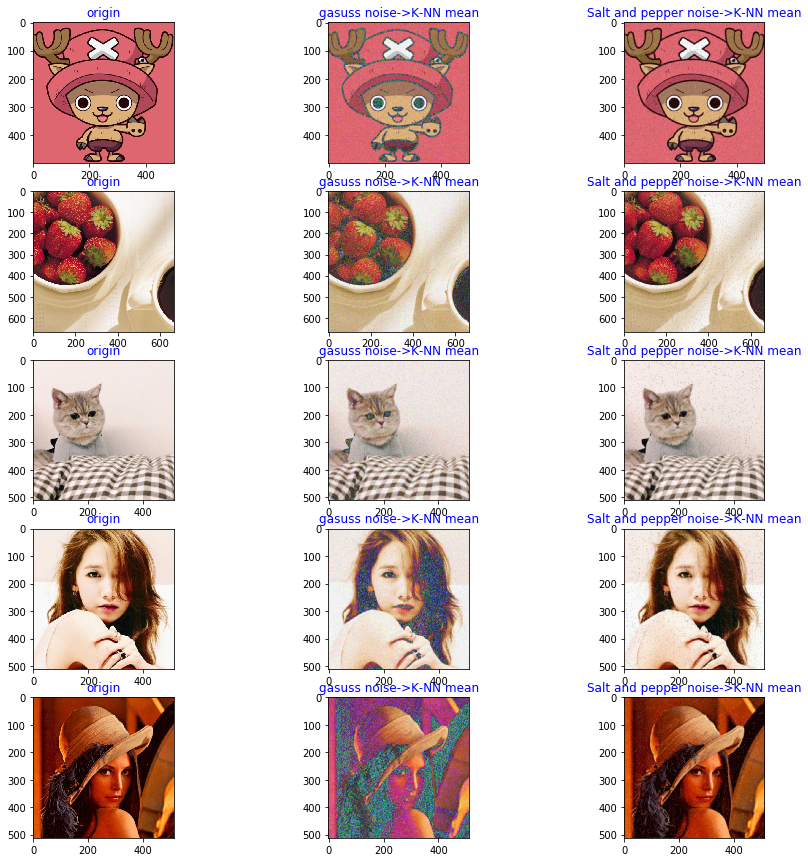

In [11]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["origin","gasuss noise->K-NN mean","Salt and pepper noise->K-NN mean"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]]
    #高斯噪声->K-NN均值滤波
    gasuss = cv2.blur(gasuss_noise(img_2,var=0.01), (4, 4))
    #椒盐噪声->K-NN均值滤波
    Salt = cv2.blur(sp_noise(img_2,0.01), (4, 4))
    images = [img_2,gasuss, Salt]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * 3 + j)
        plt.imshow(img)
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题3：采用K-NN中值滤波对二种噪声图像进行去噪，测试3组不同的参数，输出结果图像，并分析实验效果。

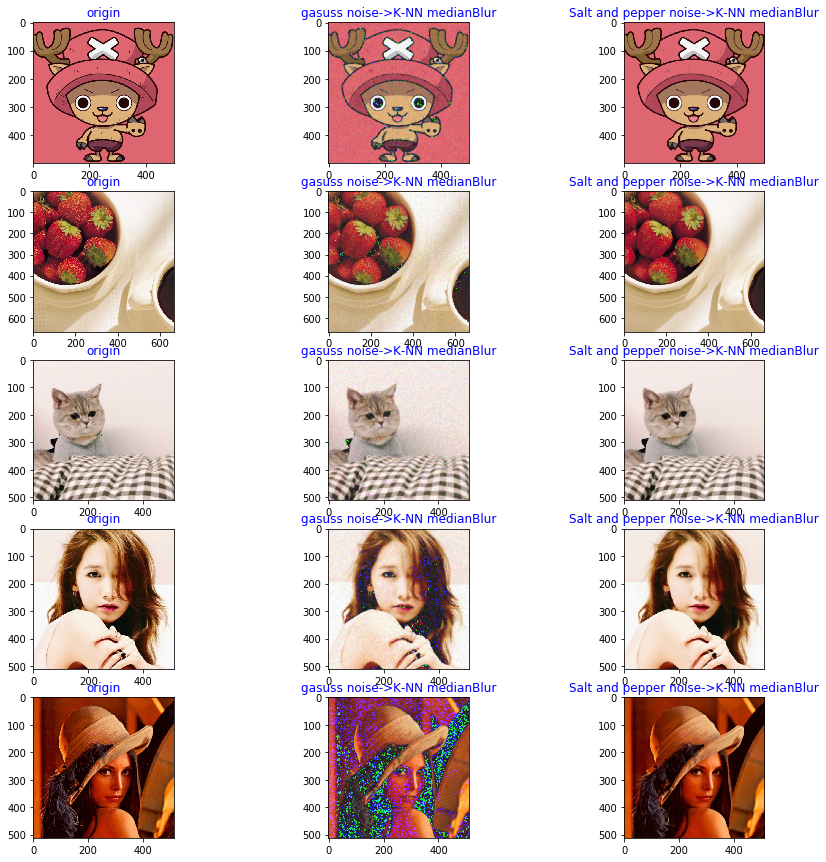

In [12]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["origin","gasuss noise->K-NN medianBlur","Salt and pepper noise->K-NN medianBlur"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    img_2 = img2[:,:,[2,1,0]]
    #高斯噪声->K-NN均值滤波
    gasuss = cv2.medianBlur(gasuss_noise(img_2,var=0.01), 5)
    #椒盐噪声->K-NN均值滤波
    Salt = cv2.medianBlur(sp_noise(img_2,0.01), 5)
    images = [img_2,gasuss, Salt]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img)
        plt.title(stage[j],color='blue') 
plt.show()

### 实验二：数字图像频域增强实验

#### 作业一：彩色图像的频域滤波器

##### 问题1：采用高斯低通滤波器对彩色图像进行滤波操作, 取半径为5, 20, 50, 80和250, 分别输出空域和频域的结果图像。

**算法原理**
	频域高斯低通滤波器的公式如下：
$$
H(u, v)=e^{\frac{-D^{2}(u, v)}{2 D_{0}^{2}}}
$$


In [9]:
def GaussianLowFilter(image,d):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    def make_transform_matrix(d):
        transfor_matrix = np.zeros(image.shape)
        center_point = tuple(map(lambda x:(x-1)/2,image.shape))
        for i in range(transfor_matrix.shape[0]):
            for j in range(transfor_matrix.shape[1]):
                def cal_distance(pa,pb):
                    from math import sqrt
                    dis = sqrt((pa[0]-pb[0])**2+(pa[1]-pb[1])**2)
                    return dis
                dis = cal_distance(center_point,(i,j))
                transfor_matrix[i,j] = np.exp(-(dis**2)/(2*(d**2)))
        return transfor_matrix
    d_matrix = make_transform_matrix(d)
    new_img = np.abs(np.fft.ifft2(np.fft.ifftshift(fshift*d_matrix)))
    return new_img

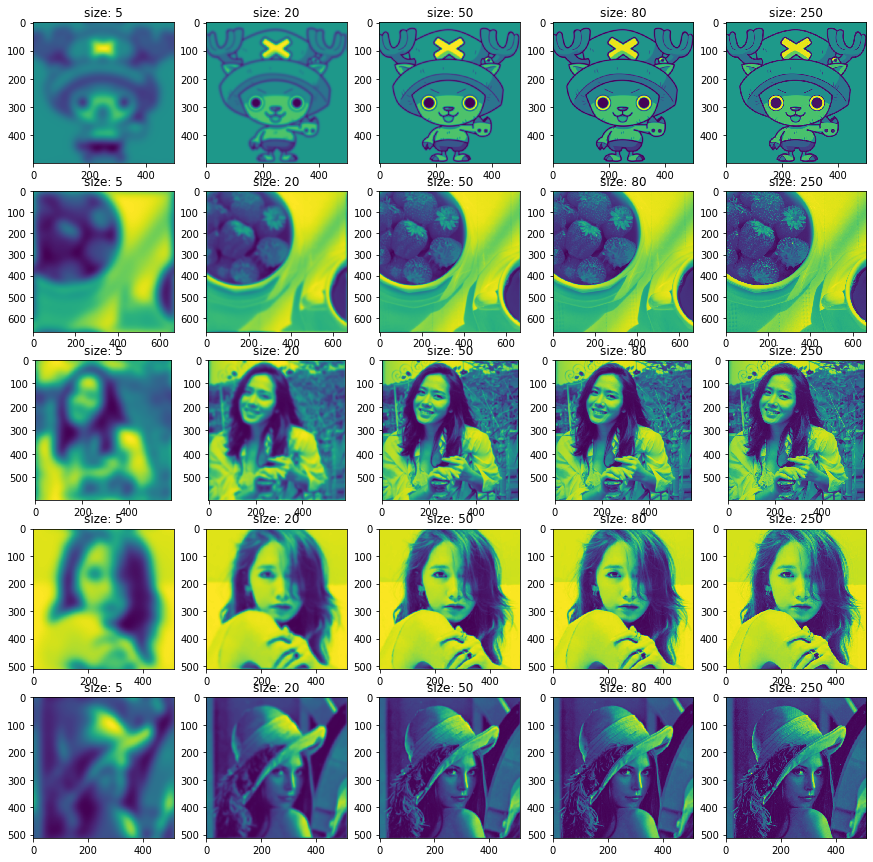

In [10]:
size = [5,20,50,80,250];
image = ["1.jpg","2.bmp","4.jpg","7.jpg","5.bmp"]
plt.figure(figsize=(15,15))

for j,element in enumerate(image):
    img2 = cv2.imread(element,0)
#     img_2 = img2[:,:,[2,1,0]]
    for i, element1 in enumerate(size):
        img_blur = GaussianLowFilter(img2,element1)
        plt.subplot(len(image), 5, 1 + i  + j * 5)
        plt.imshow(img_blur)
        plt.title('size: ' + str(element1))
plt.show()

##### 问题2：自行选择一种频域的高通滤波器对彩色图像进行滤波操作, 取3组不同的参数进行实验，根据实验效果进行参数的比较分析。

**算法原理**：频域高斯高通滤波器的公式如下：

$$
H(u, v)=1-e^{\frac{-D^{2}(u, v)}{2 D_{0}^{2}}}
$$

In [12]:
def GaussianLowFilter(image,d):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    def make_transform_matrix(d):
        transfor_matrix = np.zeros(image.shape)
        center_point = tuple(map(lambda x:(x-1)/2,image.shape))
        for i in range(transfor_matrix.shape[0]):
            for j in range(transfor_matrix.shape[1]):
                def cal_distance(pa,pb):
                    from math import sqrt
                    dis = sqrt((pa[0]-pb[0])**2+(pa[1]-pb[1])**2)
                    return dis
                dis = cal_distance(center_point,(i,j))
                #修改函数
                transfor_matrix[i,j] = 1-np.exp(-(dis**2)/(2*(d**2)))
        return transfor_matrix
    d_matrix = make_transform_matrix(d)
    new_img = np.abs(np.fft.ifft2(np.fft.ifftshift(fshift*d_matrix)))
    return new_img

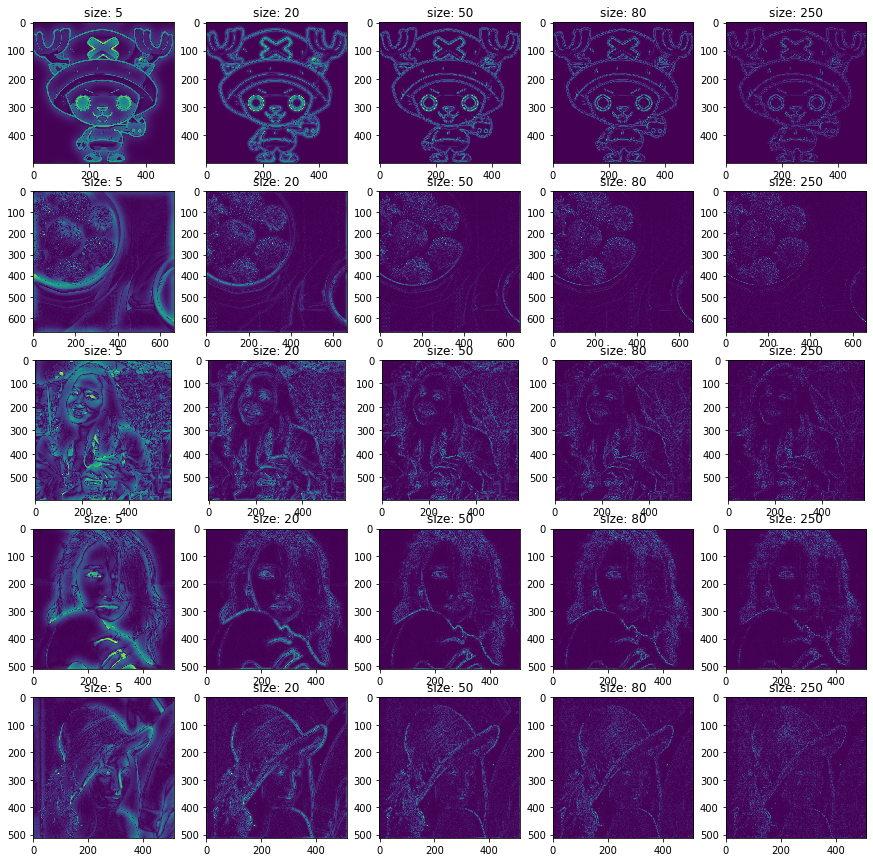

In [13]:
size = [5,20,50,80,250];
image = ["1.jpg","2.bmp","4.jpg","7.jpg","5.bmp"]
plt.figure(figsize=(15,15))

for j,element in enumerate(image):
    img2 = cv2.imread(element,0)
#     img_2 = img2[:,:,[2,1,0]]
    for i, element1 in enumerate(size):
        img_blur = GaussianLowFilter(img2,element1)
        plt.subplot(len(image), 5, 1 + i  + j * 5)
        plt.imshow(img_blur)
        plt.title('size: ' + str(element1))
plt.show()

#### 作业二: 灰度和彩色图像的快速傅立叶变换


##### 问题1：对输入的灰度和彩色图像进行快速傅立叶变换,显示频谱图;
**算法原理：**
快速傅里叶变换的基本思想是把原始的N点序列，依次分解成一系列的短序列。

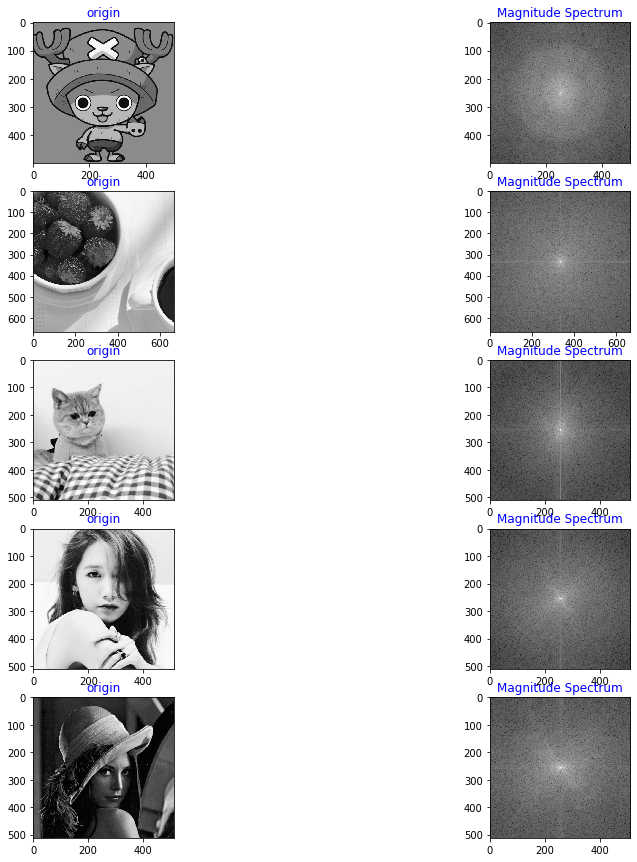

In [15]:

image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["origin","Magnitude Spectrum"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    
    # 灰度图快速傅立叶变换
    dft=cv2.dft(np.float32(img2),flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift=np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
    
    images = [img2,magnitude_spectrum]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题2：进行逆变换,观察结果。

**算法原理：** \
将得到的频谱图进行逆变换，从频域转化为空间域。

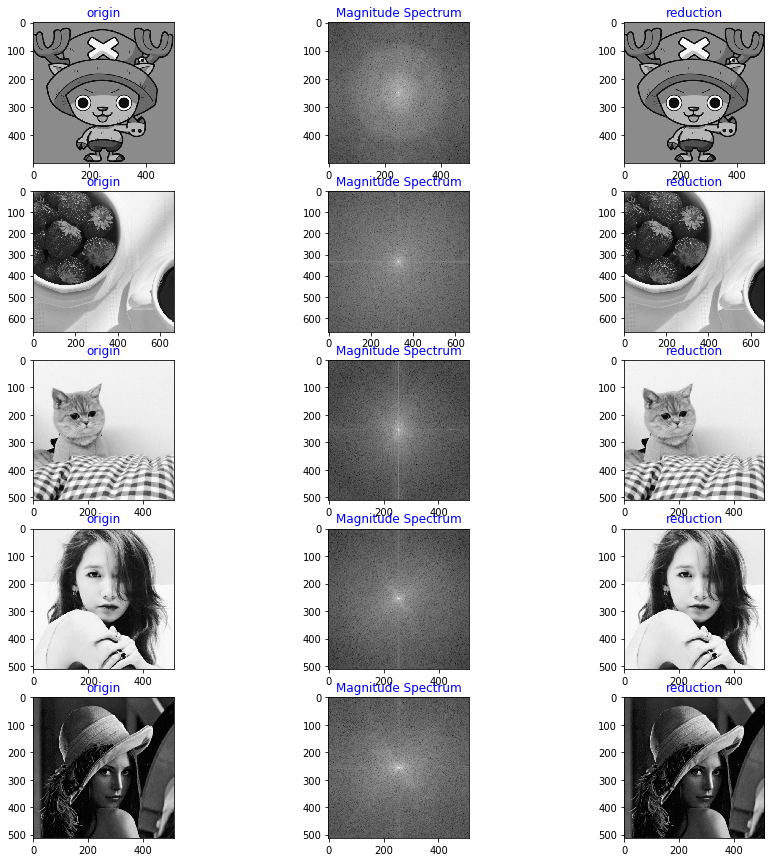

In [16]:

image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["origin","Magnitude Spectrum","reduction"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    
    # 灰度图快速傅立叶变换
    dft=cv2.dft(np.float32(img2),flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift=np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
    
    # 逆变换
    fshift=np.fft.ifftshift(dft_shift)
    img_back=cv2.idft(fshift)
    img_back=cv2.magnitude(img_back[:,:,0],img_back[:,:,1])
    
    images = [img2,magnitude_spectrum,img_back]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()

# 分析：
# 经过快速傅里叶变换后的图片逆变换后图像的细节不会丢失，图像不会发生改变。

#### 作业三：灰度和彩色图像的离散余弦变换


##### 问题1：对输入的灰度和彩色图像进行分块，每一块图像为8*8像素的大小。对分块图像进行离散余弦变换，输出频谱图（DCT系数）；

In [17]:
# 快速DCT变换补充大小
def dctpad(src):
    h, w = src.shape[:2]
    h1 = int((h / 8 + 0.5)) * 8
    w1 = int((w / 8 + 0.5)) * 8
    # 拷贝到补充的数组
    dft_A = np.zeros((h1, w1), dtype=np.float32)
    dft_A[:h, :w] = src
    return dft_A

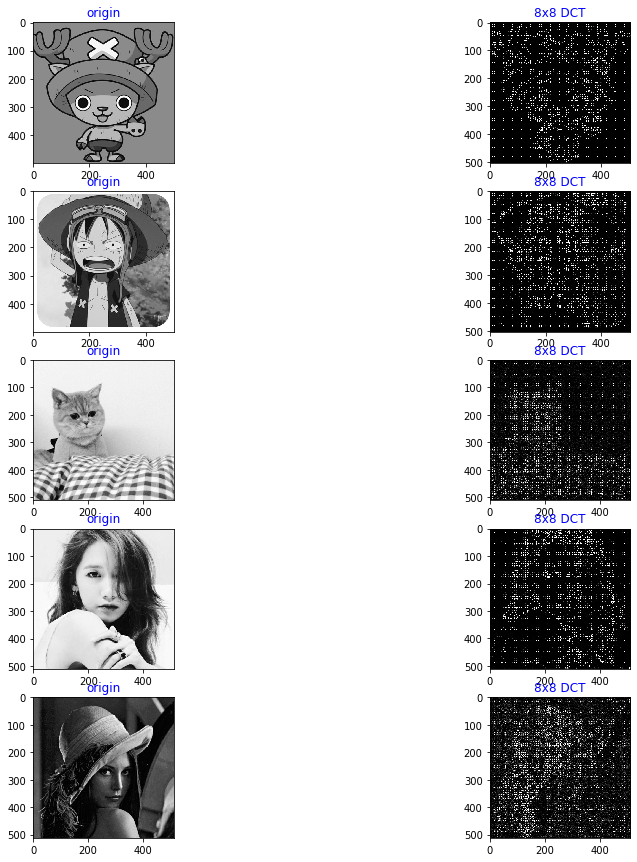

In [18]:
image = ["1.jpg","3.jpg","2.jpg","7.jpg","5.bmp"]
stage = ["origin","8x8 DCT"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    
    # 图片的高度和宽度
    h, w = img2.shape[:2]

    imgf = dctpad(img2)
    dct = np.zeros_like(imgf)
    imsize = imgf.shape
    # 8x8 DCT
    for x in range(0, imgf.shape[0], 8):
        for y in range(0, imgf.shape[1], 8):
            dct[x:(x + 8), y:(y + 8)] = cv2.dct(imgf[x:(x + 8), y:(y + 8)])
    
    images = [img2,dct]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        if(j==1):
            plt.imshow(img,cmap = 'gray', vmax=np.max(dct) * 0.01, vmin=0)
        else:
            plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题2：尝试改变部分的DCT系数；

保留系数 7.849506% 
保留系数 8.179800% 
保留系数 4.586411% 
保留系数 6.733322% 
保留系数 5.880737% 


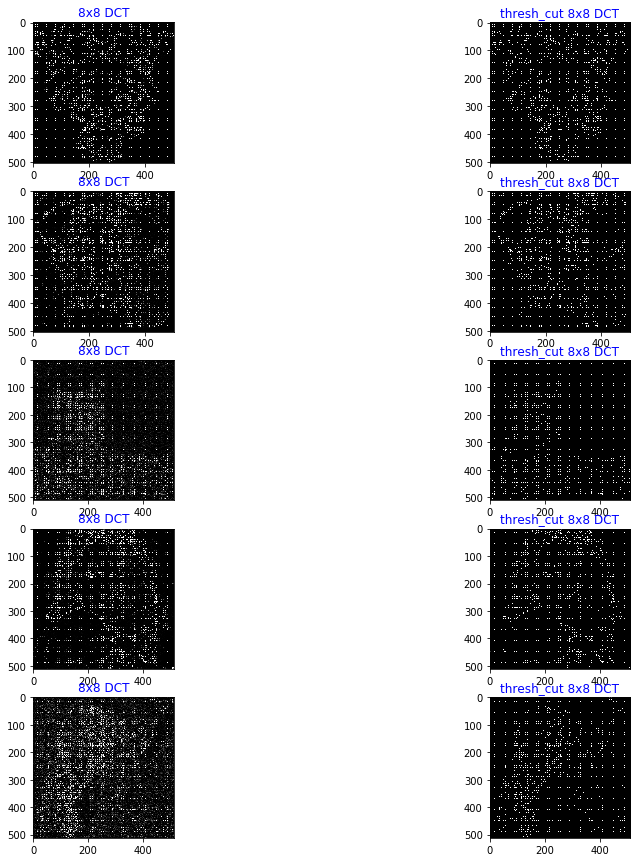

In [19]:
# 算法原理：
# 阈值分割，舍弃高频系数（AC系数），保留低频信息（DC系数）。
image = ["1.jpg","3.jpg","2.jpg","7.jpg","5.bmp"]
stage = ["8x8 DCT","thresh_cut 8x8 DCT"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    
    # 图片的高度和宽度
    h, w = img2.shape[:2]

    imgf = dctpad(img2)
    dct = np.zeros_like(imgf)
    imsize = imgf.shape
    # 8x8 DCT
    for x in range(0, imgf.shape[0], 8):
        for y in range(0, imgf.shape[1], 8):
            dct[x:(x + 8), y:(y + 8)] = cv2.dct(imgf[x:(x + 8), y:(y + 8)])
    # 阈值分割，相当于量化
    thresh = 0.012
    dct_thresh = dct * (abs(dct) > (thresh * np.max(dct)))
    
    images = [dct,dct_thresh]
    percent_nonzeros = [np.sum(dct_thresh != 0.0) / (imsize[0] * imsize[1] * 1.0)]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img,cmap = 'gray', vmax=np.max(dct) * 0.01, vmin=0)
        plt.title(stage[j],color='blue') 
        if(j%2==0):
            print("保留系数 %f%% " % (percent_nonzeros[j] * 100.0))
plt.show()

# 分析：
# 选取阈值为0.012，将每个小块的图像进行系数改变，舍去图像细节，减少图像数据量。

##### 问题3：通过离散余弦逆变换，还原出图像，观察与原图像之间的区别。
**算法原理：**
对上述步骤得到的每个图像块进行IDCT变换，然后组合得到压缩后的图像。

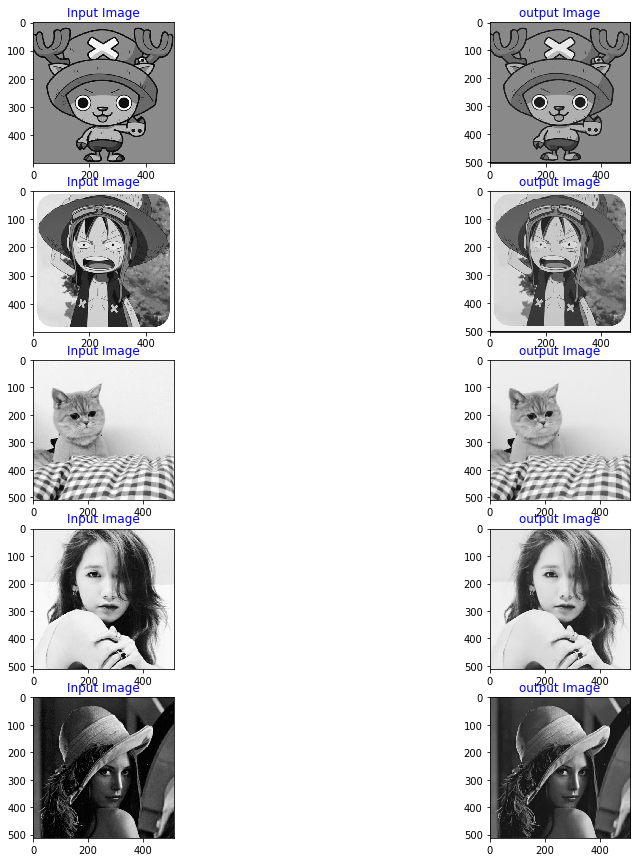

In [20]:
image = ["1.jpg","3.jpg","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    
    # 图片的高度和宽度
    h, w = img2.shape[:2]

    imgf = dctpad(img2)
    dct = np.zeros_like(imgf)
    imsize = imgf.shape
    # 8x8 DCT
    for x in range(0, imgf.shape[0], 8):
        for y in range(0, imgf.shape[1], 8):
            dct[x:(x + 8), y:(y + 8)] = cv2.dct(imgf[x:(x + 8), y:(y + 8)])
    # 阈值分割，相当于量化
    thresh = 0.012
    dct_thresh = dct * (abs(dct) > (thresh * np.max(dct)))
        
    im_dct = np.zeros(imsize)
    # 8x8 IDCT
    for x in range(0, im_dct.shape[0], 8):
        for y in range(0, im_dct.shape[1], 8):
            im_dct[x:(x + 8), y:(y + 8)] = cv2.idct(dct_thresh[x:(x + 8), y:(y + 8)])
    
    images = [img2,im_dct]
    percent_nonzeros = [np.sum(dct_thresh != 0.0) / (imsize[0] * imsize[1] * 1.0)]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img,cmap = 'gray')
        plt.title(stage[j],color='blue') 
plt.show()

# 分析：
# 经过逆变换后得到的压缩图像部分细节丢失，图像变得模糊，但是总体观感依旧不错，压缩质量很好。

### 实验三： 数字图像分割与边缘检测实验

#### 作业一：使用一阶和二阶检测算子（导数）进行图像的边缘检测。


##### 问题1：编写程序实现一阶Sobel算子，进行图像的边缘提取；
**Sobel算子**
Sobel算子依然是一种过滤器，只是其是带有方向的。在OpenCV-Python中，
使用Sobel的算子的函数原型如下：
dst = cv2.Sobel(src, ddepth, dx, dy[, dst[, ksize[, scale[, delta[, borderType]]]]]) 
前四个是必须的参数：
第一个参数是需要处理的图像；
第二个参数是图像的深度，-1表示采用的是与原图像相同的深度。目标图像的深度必须大于等于原图像的深度；
dx和dy表示的是求导的阶数，0表示这个方向上没有求导，一般为0、1、2。
其后是可选的参数：
dst：结果图；
ksize是Sobel算子的大小，必须为1、3、5、7。
scale是缩放导数的比例常数，默认情况下没有伸缩系数；
delta是一个可选的增量，将会加到最终的dst中，同样，默认情况下没有额外的值加到dst中；
borderType是判断图像边界的模式。这个参数默认值为cv2.BORDER_DEFAULT。

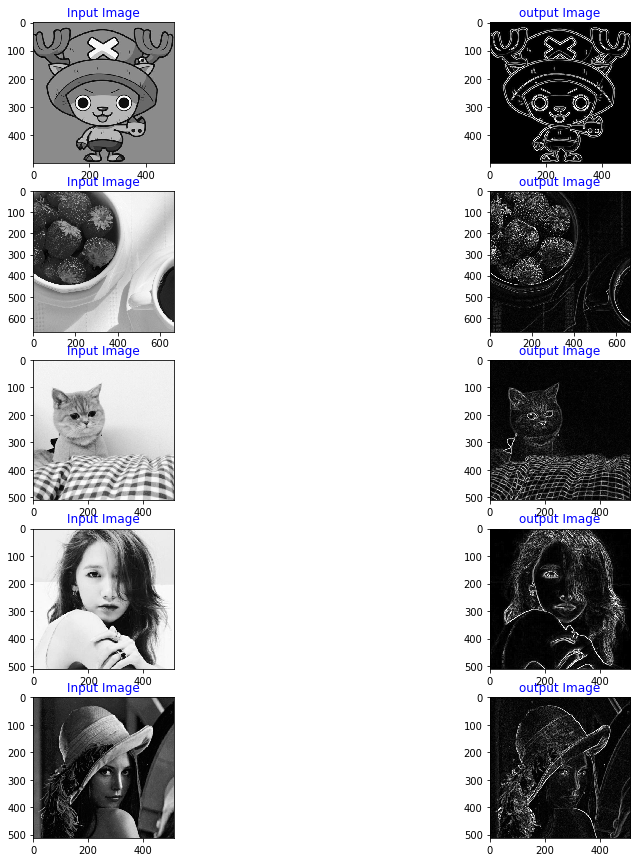

In [21]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    #coding=utf-8 
    x = cv2.Sobel(img2,cv2.CV_16S,1,0)
    y = cv2.Sobel(img2,cv2.CV_16S,0,1)
 
    absX = cv2.convertScaleAbs(x)# 转回uint8 
    absY = cv2.convertScaleAbs(y)
    Sobel = cv2.addWeighted(absX,0.5,absY,0.5,0)
    
    images = [img2,Sobel]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img, cmap='gray')
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题2：编写程序实现一阶Prewitt算子，进行图像的边缘提取；

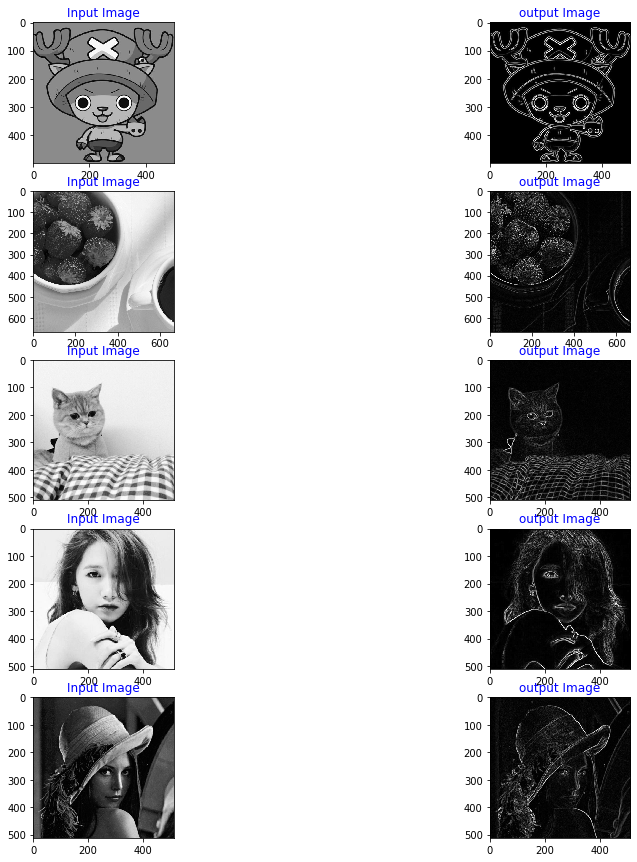

In [22]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    #Prewitt算子
    kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]],dtype=int)
    kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]],dtype=int)
    x = cv2.filter2D(img2, cv2.CV_16S, kernelx)
    y = cv2.filter2D(img2, cv2.CV_16S, kernely)
    #转uint8
    absX = cv2.convertScaleAbs(x)       
    absY = cv2.convertScaleAbs(y)    
    Prewitt = cv2.addWeighted(absX,0.5,absY,0.5,0)
    
    images = [img2,Prewitt]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img, cmap='gray')
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题3：编写程序实现一阶Roberts算子，进行图像的边缘提取；

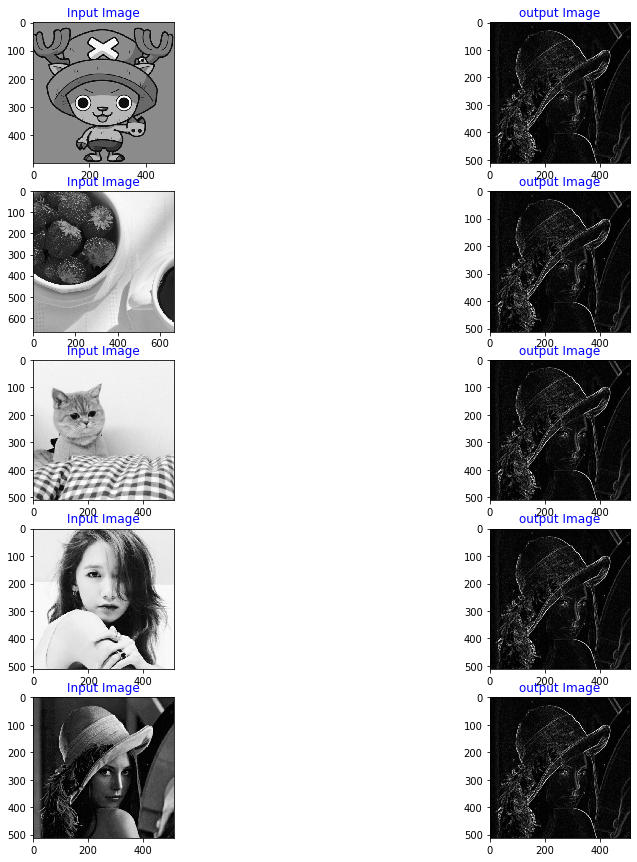

In [23]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)
    #Roberts算子
    kernelx = np.array([[-1,0],[0,1]], dtype=int)
    kernely = np.array([[0,-1],[1,0]], dtype=int)
    x = cv2.filter2D(img2, cv2.CV_16S, kernelx)
    y = cv2.filter2D(img2, cv2.CV_16S, kernely)
    #转uint8 
    absX = cv2.convertScaleAbs(x)      
    absY = cv2.convertScaleAbs(y)    
    Roberts = cv2.addWeighted(absX,0.5,absY,0.5,0)
    
    images = [img2,Prewitt]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img, cmap='gray')
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题4：编写程序实现二阶Laplacian算子（3*3），进行图像的边缘提取。

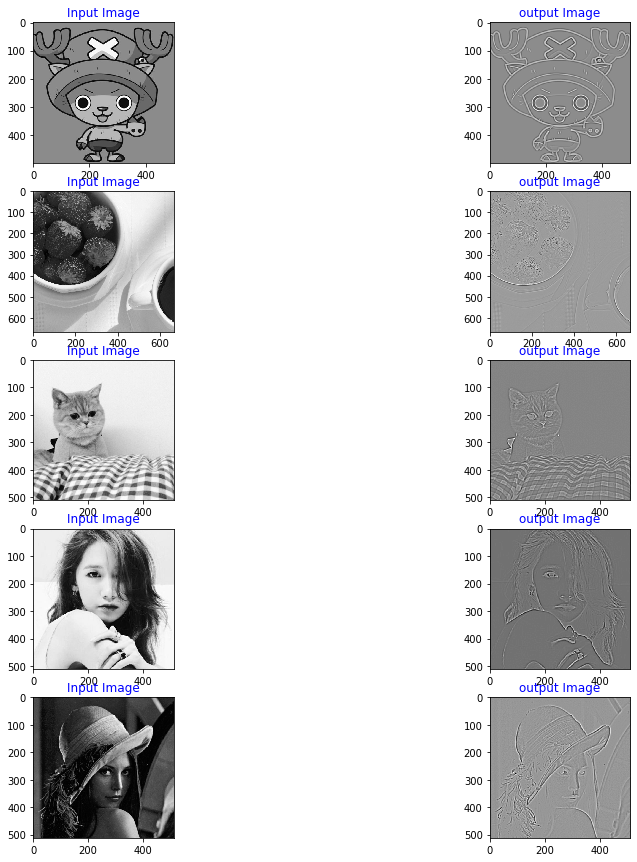

In [24]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element,0)

    laplacian=cv2.Laplacian(img2,cv2.CV_64F,ksize=11)
    
    images = [img2,laplacian]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        plt.imshow(img, cmap='gray')
        plt.title(stage[j],color='blue') 
plt.show()

#### 作业二： Hough线检测


##### 问题1：对作业一中边缘检测的结果，进行Hough线检测。

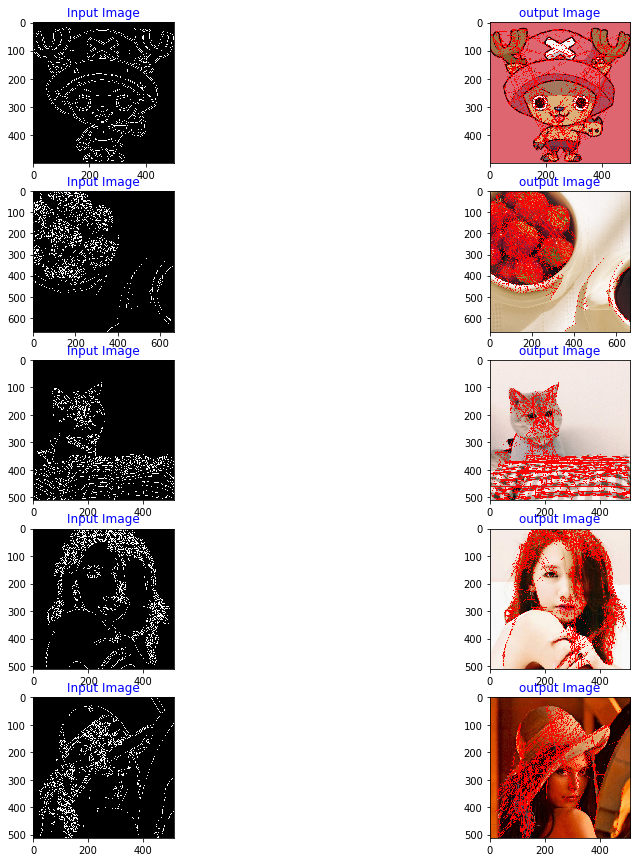

In [25]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    #灰度图像 
    gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray,50,200)
    
    #hough transform
    lines = cv2.HoughLinesP(edges,1,np.pi/180,30,minLineLength=10,maxLineGap=50)
    #提取为二维
    lines1 = lines[:,0,:]
    for x1,y1,x2,y2 in lines1[:]: 
        cv2.line(img2,(x1,y1),(x2,y2),(0,0,255),1)
   
    images = [edges,img2]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        if(j%2==0):
            plt.imshow(img, cmap='gray')
        else:
            img = img[:,:,[2,1,0]]
            plt.imshow(img)
        plt.title(stage[j],color='blue') 
plt.show()

##### 问题2：调节参数，提取较长的边界。

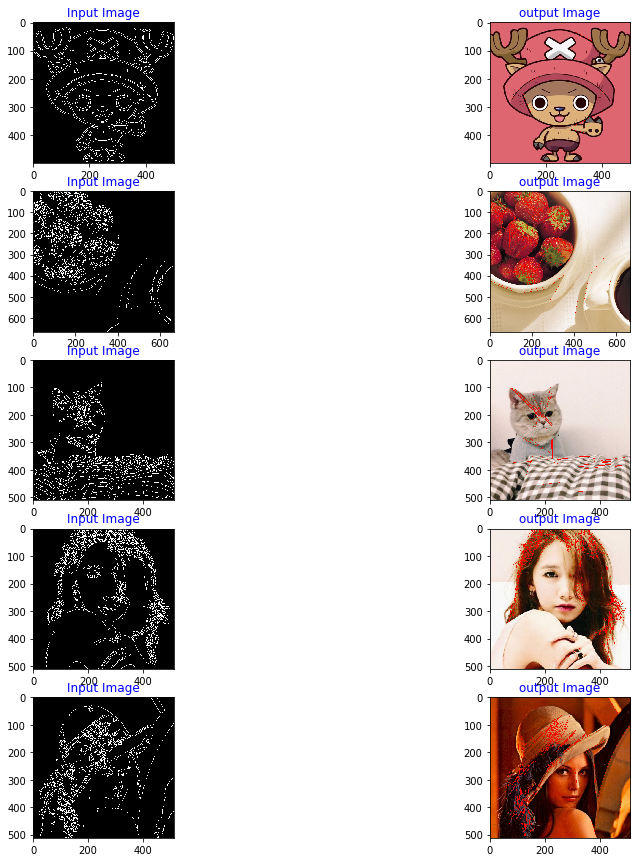

In [26]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
stage = ["Input Image","output Image"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img2 = cv2.imread(element)
    #灰度图像 
    gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray,50,200)
    
    #hough transform
    lines = cv2.HoughLinesP(edges,1,np.pi/180,30,minLineLength=60,maxLineGap=10)
    #提取为二维
    lines1 = lines[:,0,:]
    for x1,y1,x2,y2 in lines1[:]: 
        cv2.line(img2,(x1,y1),(x2,y2),(0,0,255),1)
   
    images = [edges,img2]
    for j, img in  enumerate(images):
        plt.subplot(len(image), len(stage), 1 + i * len(stage) + j)
        if(j%2==0):
            plt.imshow(img, cmap='gray')
        else:
            img = img[:,:,[2,1,0]]
            plt.imshow(img)
        plt.title(stage[j],color='blue') 
plt.show()

#### 作业三：采用阈值处理方法进行图像分割

##### 问题1：参考相关文献，编写程序实现Otsu自动阈值法；

In [27]:
#Ostu自适应阈值法实现
def Otsu(img):
    #设置初始阈值为0
    thres = 0
    #前景与背景的平均灰度设为0
    m1 = 0
    m2 = 0
    #前景与背景的灰度总值
    h_sum = 0
    c_sum = 0
    #前景与背景的像素个数
    n1 = 0
    n2 = 0
    #记录最大方差和当前阈值对应的方差值
    fmax = 0
    curr_f = 0
    #初始化灰度值统计数组
    ihist = [0] * 256
    height, width = img.shape
    n = height * width
    #统计灰度值
    for i in range(height):
        for j in range(width):
            ihist[img[i,j]] += 1
    #计算总灰度值
    for i in range(256):
        h_sum += i * ihist[i]
    #遍历所有灰度值，找到最大方差的阈值
    n1 = 0
    for k in range(255):
        n1 += ihist[k]
        n2 = n - n1
        if n1 == 0:
            continue
        n2 = n - n1
        if n2 == 0:
            break
        #计算前景的总灰度值
        c_sum += k*ihist[k]
        m1 = c_sum/n1
        m2 = (h_sum - c_sum)/n2
        curr_f = 1.0 * n1 * n2 * (m1-m2)**2
        #找到最大方差对应的灰度值
        if( curr_f > fmax ):
            fmax = curr_f
            thres = k
    return thres
#二值化图像
def Binarize(img, thres):
    return img > thres


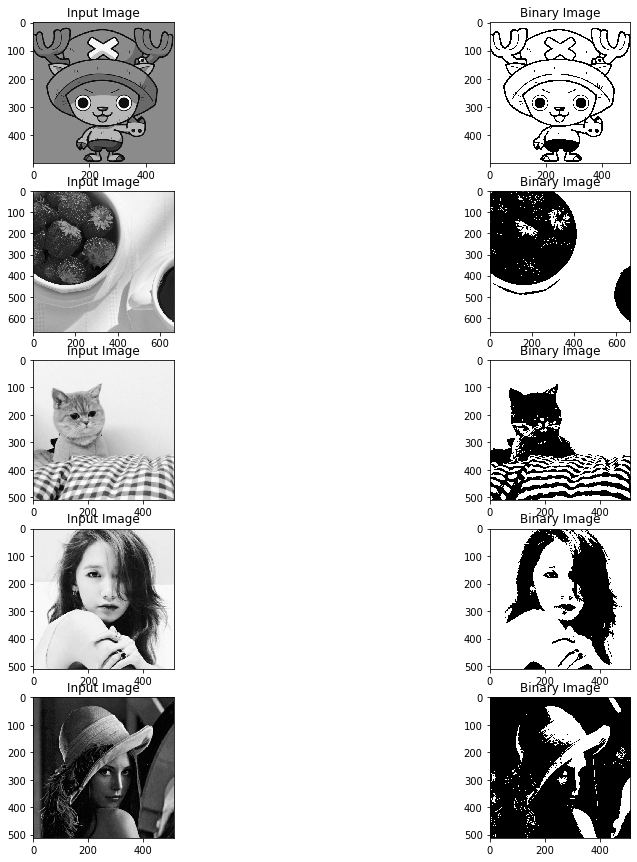

In [28]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]

plt.figure(figsize=(15,15))
for i, name in enumerate(image):
    img = cv2.imread(name,0)
    thres = Otsu(img)
    bw = Binarize(img, thres)
    plt.subplot(5,2,1 + i * 2),plt.imshow(img ,cmap='gray')
    plt.title('Input Image')
    plt.subplot(5,2,2 + i * 2),plt.imshow(bw ,cmap='gray')
    plt.title('Binary Image')
plt.show()

##### 问题2：实现直方图阈值法，具体方法为采用灰度直方图求双峰或多峰，选择两峰之间的谷底作为阈值，将图像转换为2值图像。

In [29]:
 #统计像素值
def grayHist(image):
    rows,cols=image.shape
    grayHist=np.zeros([256],np.uint8)
    for r in range(rows):
        for c in range(cols):
            grayHist[image[r][c]]+=1
    return grayHist

#找到两峰之间的谷底
def threshLow(image):
    histogram=grayHist(image)
    #找到第一个峰值
    max_1=np.where(histogram==np.max(histogram))
    first=max_1[0][0]
    #找到第二个峰值
    measureDists=np.zeros([256],np.float32)
    for k in range(256):
        measureDists[k]=pow(k-first,2)*histogram[k]
    max_2=np.where(measureDists==np.max(measureDists))
    second=max_2[0][0]
    #找两个峰值之间的最小值对应的灰度值作为阈值
    thresh=0
    if first>second:
        temp=histogram[int(second):int(first)]
        min_t=np.where(temp==np.min(temp))
        thresh=min_t[0][0]+second+1
    else:
        temp=histogram[int(first):int(second)]
        min_t=np.where(temp==np.min(temp))
        thresh=min_t[0][0]+first+1

    return thresh
#二值化图像
def Binarize(img, thresh):
    return img > thresh

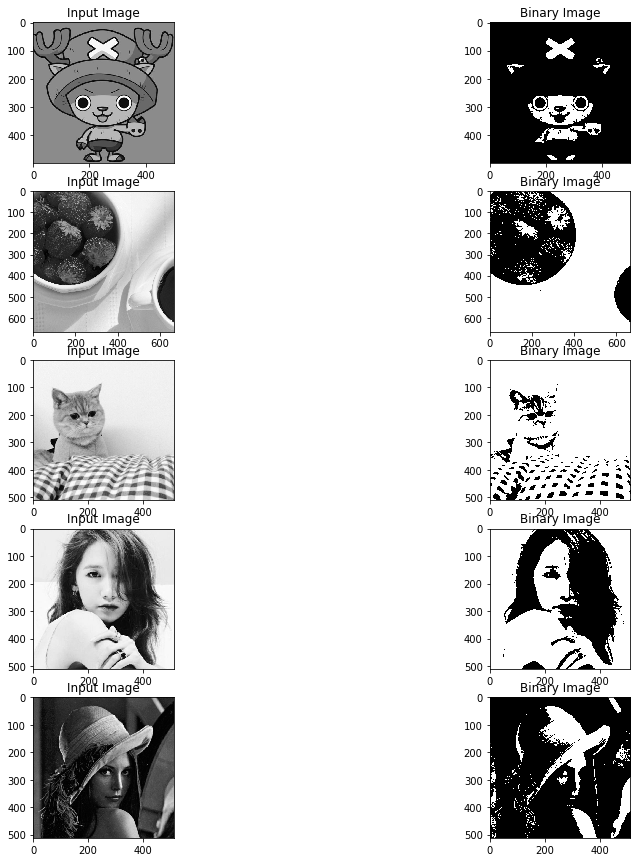

In [30]:
image = ["1.jpg","2.bmp","2.jpg","7.jpg","5.bmp"]
plt.figure(figsize=(15,15))
for i, element in enumerate(image):
    img = cv2.imread(element,0)
    thres = threshLow(img)
    bw = Binarize(img, thres)
    plt.subplot(5,2,1 + i * 2)
    plt.imshow(img ,cmap='gray')
    plt.title('Input Image')
    plt.subplot(5,2,2 + i * 2)
    plt.imshow(bw ,cmap='gray')
    plt.title('Binary Image')
plt.show()

### 实验四：  数字图像编码实验

#### 作业一: 无损编码/压缩算法实验

##### 问题1: 实现行程编码压缩, 肉眼观察压缩效果，并计算原图和压缩以后的尺寸，计算压缩率并比较分析；


In [2]:
def is_image_file(file_name):
    return any(
        file_name.endswith(extension)
        for extension in [".png", ".jpg", ".jpeg", '.PNG', '.JPG', '.JPEG'])


def default_loader(path):
    return cv2.imread(path, cv2.IMREAD_COLOR)


def gray_loader(path):
    return cv2.imread(path, cv2.IMREAD_GRAYSCALE)


def hsv_loader(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)


# Run Length Encoding 行程编码
class RLE:
    def __init__(self, path):
        self.path = path
        self.image_list = [x for x in listdir(path) if is_image_file(x)]
        self.image_list = sorted(self.image_list)

    def matrix2list(self, matirx):
        """ 按照行程编码样式将2维数组展开为一维数组 """
        mrows, mcols = matirx.shape[:2]
        mrows -= 1
        mcols -= 1
        mlen = min(mrows, mcols)

        rmatrix = []
        rmatrix.append(matirx[0][0])

        rmatrix.extend(self.first_encode(matirx, mlen))

        if mcols > mrows:
            rmatrix.extend(
                self.colmore_middle_encode(matirx, mlen, mcols, mrows))
            rmatrix.extend(self.colmore_last_encode(matirx, mlen, mcols,
                                                    mrows))
        else:
            rmatrix.extend(
                self.rowmore_middle_encode(matirx, mlen, mcols, mrows))
            rmatrix.extend(self.rowmore_last_encode(matirx, mlen, mcols,
                                                    mrows))

        rmatrix.append(matirx[-1][-1])

        return rmatrix

    def first_encode(self, matirx, mlen):
        rmatrix = []
        for len in range(1, mlen + 1):
            if (len % 2 == 1):
                for i in range(0, len + 1):
                    rmatrix.append(matirx[i][len - i])
            else:
                for i in range(0, len + 1):
                    rmatrix.append(matirx[len - i][i])
        return rmatrix

    def colmore_middle_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mlen % 2 == 0:
            for extra in range(mcols - mrows):
                if extra % 2 == 0:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i][mlen - i + extra + 1])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i][i + extra + 1])
        else:
            for extra in range(mcols - mrows):
                if extra % 2 == 1:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i][mlen - i + extra + 1])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i][i + extra + 1])
        return rmatrix

    def colmore_last_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mcols % 2 == 0:
            for len in range(0, mlen - 1):
                if len % 2 == 0:
                    for i in range(mlen - len):
                        rmatrix.append(
                            matirx[mlen - (mlen - 1 - len - i)][mlen - i +
                                                                mcols - mrows])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen -
                                              i][mlen - (mlen - 1 - len - i) +
                                                 mcols - mrows])
        else:
            for len in range(0, mlen - 1):
                if len % 2 == 1:
                    for i in range(mlen - len):
                        rmatrix.append(
                            matirx[mlen - (mlen - 1 - len - i)][mlen - i +
                                                                mcols - mrows])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen -
                                              i][mlen - (mlen - 1 - len - i) +
                                                 mcols - mrows])
        return rmatrix

    def rowmore_middle_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mlen % 2 == 0:
            for extra in range(mrows - mcols):
                if extra % 2 == 1:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i + extra + 1][i])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i + extra + 1][mlen - i])
        else:
            for extra in range(mrows - mcols):
                if extra % 2 == 0:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i + extra + 1][i])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i + extra + 1][mlen - i])

        return rmatrix

    def rowmore_last_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mrows % 2 == 0:
            for len in range(0, mlen - 1):
                if len % 2 == 0:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - (mlen - 1 - len - i) +
                                              mrows - mcols][mlen - i])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - i + mrows -
                                              mcols][mlen -
                                                     (mlen - 1 - len - i)])
        else:
            for len in range(0, mlen - 1):
                if len % 2 == 1:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - (mlen - 1 - len - i) +
                                              mrows - mcols][mlen - i])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - i + mrows -
                                              mcols][mlen -
                                                     (mlen - 1 - len - i)])
        return rmatrix

    def encode(self, lst):
        lst_encode = np.array([(len(list(group)), name)
                               for name, group in groupby(lst)])
        return lst_encode.flatten()

    def decode(self, lst_encode):
        lst = []
        for i in range(0, len(lst_encode), 2):
            print(lst_encode[i])
            length = int(lst_encode[i])
            for j in range(length):
                lst.append(lst_encode[i + 1])
        return lst

    def test(self):
        img3 = np.array(range(1, 9 + 1)).reshape(3, 3)
        img5 = np.array(range(1, 25 + 1)).reshape(5, 5)
        img4 = np.array(range(1, 16 + 1)).reshape(4, 4)

        img = np.array([[5, 4, 1, 2], [4, 3, 2, 1], [3, 3, 2, 1], [2, 3, 1,
                                                                   0]])

        col_img46 = np.array(range(1, 24 + 1)).reshape(4, 6)
        col_img45 = np.array(range(1, 20 + 1)).reshape(4, 5)
        col_img35 = np.array(range(1, 15 + 1)).reshape(3, 5)

        row_img53 = np.array(range(1, 15 + 1)).reshape(5, 3)
        row_img54 = np.array(range(1, 20 + 1)).reshape(5, 4)
        row_img64 = np.array(range(1, 24 + 1)).reshape(6, 4)
        # code = self.encode(self.matrix2list(col_img))
        # print(self.decode(code))

        print(self.matrix2list(row_img64))

    def compress(self, index):
        try:
            image_path = os.path.join(self.path, self.image_list[index - 1])
        except:
            print("ERROR！ 并不包含你想要进行RGB处理的这张图片")
        else:
            image_name = re.findall(r'(.+?)\.', self.image_list[index - 1])

            image = default_loader(image_path)

            size = sys.getsizeof((image.flatten()))

            print("Image {}:".format(index))

            print("Origin Image's Size is {:.2f} KB.".format(size / 1024))

            [b, g, r] = cv2.split(image)

            r_b = self.encode(self.matrix2list(b)).astype(np.uint8)
            r_g = self.encode(self.matrix2list(g)).astype(np.uint8)
            r_r = self.encode(self.matrix2list(r)).astype(np.uint8)

            # # 通过打印下面的语句，可以证明最终的存储比例超过200%，是因为对于
            # # 多维度图片的每个维度通道新建不同的数组进行保存的时候，开辟新数组
            # # 空间导致的过大的存储消耗，与压缩算法本身无关。
            # print(b.flatten().shape, r_b.shape)
            # print(g.flatten().shape, r_g.shape)
            # print(r.flatten().shape, r_r.shape)
            # print(sys.getsizeof(np.array([])))

            r_size = sys.getsizeof((r_b)) + sys.getsizeof(
                (r_g)) + sys.getsizeof((r_r))

            print(
                "After Run Length Encoding Image's Size is  {:.2f} KB.\nCompressed Image's size is {:.2%} of Origin Image."
                .format(r_size / 1024, r_size / size))

            # print("Origin Image's Array Size is {} .".format(
            #     len(image.flatten())))
            # print(
            #     "After Run Length Encoding Image's Array Size is  {} .\nCompressed Image's Array size is {:%} of Origin Image."
            #     .format(
            #         len(r_b) + len(r_g) + len(r_r),
            #         (len(r_b) + len(r_g) + len(r_r)) / len(image.flatten())))

            print()

In [17]:
rle = RLE(".")
print(rle.image_list)
rle.compress(9)

['1.jpg', '2.jpg', '2jpgCompare.jpg', '2out_2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '7out.jpg', '7out_4.jpg', 'jpgCompare.jpg', 'jpgCompare.png', 'out.jpg']
Image 9:
Origin Image's Size is 765.10 KB.
After Run Length Encoding Image's Size is  1125.32 KB.
Compressed Image's size is 147.08% of Origin Image.



##### 问题2: 实现哈夫曼压缩, 肉眼观察压缩效果，并计算原图和压缩以后的尺寸，计算压缩率并比较分析；


In [15]:
class HuffmanLetter:
    def __init__(self, letter, freq):
        self.letter = letter
        self.freq = freq
        self.bitstring = ""

    def __repr__(self):
        return f"{self.letter}"


class HuffmanTreeNode:
    def __init__(self, freq, left, right):
        self.freq = freq
        self.left = left
        self.right = right


class Huffman:
    """
    Huffman coding compress for rgb image,
    using variable-length binary replace fixed-length coding
    to reduce image size.
    """
    def __init__(self, path):
        self.path = path
        self.image_list = [x for x in listdir(path) if is_image_file(x)]
        self.image_list = sorted(self.image_list)

    def byte_cut(self, image):
        """
        Split the image according to the length of the Byte (8 bits).
        """
        image_list = image.flatten()
        chars = {}
        for c in image_list:
            chars[c] = chars[c] + 1 if c in chars.keys() else 1
        return sorted([HuffmanLetter(c, f) for c, f in chars.items()],
                      key=lambda l: l.freq)

    def build_tree(self, letters):
        """
        Build huffman tree structure according to original character segment.
        """
        while len(letters) > 1:
            left = letters.pop(0)
            right = letters.pop(0)
            total_freq = left.freq + right.freq
            node = HuffmanTreeNode(total_freq, left, right)
            letters.append(node)
            letters.sort(key=lambda l: l.freq)
        return letters[0]

    def traverse_tree(self, root, bitstring):
        """
        Re-encoding according to the huffman tree structure, 
        getting huffman code.
        """
        if type(root) is HuffmanLetter:
            root.bitstring = bitstring
            return [root]
        letters = []
        letters += self.traverse_tree(root.left, bitstring + "0")
        letters += self.traverse_tree(root.right, bitstring + "1")
        return letters

    def test(self):
        test_image = np.array(np.random.randint(0, 25, size=[5, 5]))
        print(test_image.flatten())
        letters_list = self.byte_cut(test_image)
        print(letters_list)
        root = self.build_tree(letters_list)
        letters = self.traverse_tree(root, "")

        dict = {}
        for letter in letters:
            dict[letter.letter] = letter.bitstring
        # print(dict)

        compress = ""
        for bs in test_image.flatten():
            compress += dict[bs]
            # print(bs)
            # print(dict[bs])

        # for c in test_image:
        #     compress += letter.bitstring

        print(sys.getsizeof(test_image.flatten()))
        print(sys.getsizeof(compress))

    def huffman_change(self, image):
        letters_list = self.byte_cut(image)
        root = self.build_tree(letters_list)
        letters = self.traverse_tree(root, "")

        dict = {}
        for letter in letters:
            dict[letter.letter] = letter.bitstring

        compress = ""
        for bs in image.flatten():
            compress += dict[bs]

        return compress, dict

    def compress(self, index):
        try:
            image_path = os.path.join(self.path, self.image_list[index - 1])
        except:
            print("ERROR！ 并不包含你想要进行RGB处理的这张图片")
        else:
            image_name = re.findall(r'(.+?)\.', self.image_list[index - 1])

            image = default_loader(image_path)

            size = sys.getsizeof((image.flatten()))

            print("Image {}:".format(index))

            print("Origin Image's Size is {:.2f} KB.".format(size / 1024))

            [b, g, r] = cv2.split(image)

            r_b, r_b_dict = self.huffman_change(b)
            r_g, r_g_dict = self.huffman_change(g)
            r_r, r_r_dict = self.huffman_change(r)

            r = []
            r.append(r_b)
            r.append(r_g)
            r.append(r_r)

            # print(r)

            r_size = sys.getsizeof(r)
            r_dict_size = sys.getsizeof(r_b_dict) + sys.getsizeof(
                r_g_dict) + sys.getsizeof(r_r_dict)
            r_size_all = r_size + r_dict_size

            print("After Huffman Encoding Image's Size is  {:.2f} KB.\
                    \nCompressed Image's Huffman coding size is {:.2f} KB.\
                    \nCompressed Image's Huffman coding dictonary size is {:.2f} KB.\
                    \nCompressed Image's size is {:.2%} of Origin Image.".
                  format(r_size_all / 1024, r_size / 1024, r_dict_size / 1024,
                         r_size_all / size))

            print()

In [18]:
huffman = Huffman(".")
print(huffman.image_list)
huffman.compress(9)

['1.jpg', '2.jpg', '2jpgCompare.jpg', '2out_2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '7out.jpg', '7out_4.jpg', 'jpgCompare.jpg', 'jpgCompare.png', 'out.jpg']
Image 9:
Origin Image's Size is 765.10 KB.
After Huffman Encoding Image's Size is  27.40 KB.                    
Compressed Image's Huffman coding size is 0.09 KB.                    
Compressed Image's Huffman coding dictonary size is 27.30 KB.                    
Compressed Image's size is 3.58% of Origin Image.



##### 问题3: 实现一维无损预测压缩, 肉眼观察压缩效果，并计算原图和压缩以后的尺寸，计算压缩率并比较分析.

In [20]:
class PredictCode:
    """
    Linear prediction coding
    """
    def __init__(self, path):
        self.path = path
        self.image_list = [x for x in listdir(path) if is_image_file(x)]
        self.image_list = sorted(self.image_list)

    def predict_f(self, x):
        """
        Prediction function: y = x
        """
        return x

    def matrix2list(self, matirx):
        """ 按照行程编码样式将2维数组展开为一维数组 """
        mrows, mcols = matirx.shape[:2]
        mrows -= 1
        mcols -= 1
        mlen = min(mrows, mcols)

        rmatrix = []
        rmatrix.append(matirx[0][0])

        rmatrix.extend(self.first_encode(matirx, mlen))

        if mcols > mrows:
            rmatrix.extend(
                self.colmore_middle_encode(matirx, mlen, mcols, mrows))
            rmatrix.extend(self.colmore_last_encode(matirx, mlen, mcols,
                                                    mrows))
        else:
            rmatrix.extend(
                self.rowmore_middle_encode(matirx, mlen, mcols, mrows))
            rmatrix.extend(self.rowmore_last_encode(matirx, mlen, mcols,
                                                    mrows))

        rmatrix.append(matirx[-1][-1])

        return rmatrix

    def first_encode(self, matirx, mlen):
        rmatrix = []
        for len in range(1, mlen + 1):
            if (len % 2 == 1):
                for i in range(0, len + 1):
                    rmatrix.append(matirx[i][len - i])
            else:
                for i in range(0, len + 1):
                    rmatrix.append(matirx[len - i][i])
        return rmatrix

    def colmore_middle_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mlen % 2 == 0:
            for extra in range(mcols - mrows):
                if extra % 2 == 0:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i][mlen - i + extra + 1])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i][i + extra + 1])
        else:
            for extra in range(mcols - mrows):
                if extra % 2 == 1:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i][mlen - i + extra + 1])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i][i + extra + 1])
        return rmatrix

    def colmore_last_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mcols % 2 == 0:
            for len in range(0, mlen - 1):
                if len % 2 == 0:
                    for i in range(mlen - len):
                        rmatrix.append(
                            matirx[mlen - (mlen - 1 - len - i)][mlen - i +
                                                                mcols - mrows])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen -
                                              i][mlen - (mlen - 1 - len - i) +
                                                 mcols - mrows])
        else:
            for len in range(0, mlen - 1):
                if len % 2 == 1:
                    for i in range(mlen - len):
                        rmatrix.append(
                            matirx[mlen - (mlen - 1 - len - i)][mlen - i +
                                                                mcols - mrows])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen -
                                              i][mlen - (mlen - 1 - len - i) +
                                                 mcols - mrows])
        return rmatrix

    def rowmore_middle_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mlen % 2 == 0:
            for extra in range(mrows - mcols):
                if extra % 2 == 1:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i + extra + 1][i])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i + extra + 1][mlen - i])
        else:
            for extra in range(mrows - mcols):
                if extra % 2 == 0:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[mlen - i + extra + 1][i])
                else:
                    for i in range(mlen + 1):
                        rmatrix.append(matirx[i + extra + 1][mlen - i])

        return rmatrix

    def rowmore_last_encode(self, matirx, mlen, mcols, mrows):
        rmatrix = []
        if mrows % 2 == 0:
            for len in range(0, mlen - 1):
                if len % 2 == 0:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - (mlen - 1 - len - i) +
                                              mrows - mcols][mlen - i])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - i + mrows -
                                              mcols][mlen -
                                                     (mlen - 1 - len - i)])
        else:
            for len in range(0, mlen - 1):
                if len % 2 == 1:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - (mlen - 1 - len - i) +
                                              mrows - mcols][mlen - i])
                else:
                    for i in range(mlen - len):
                        rmatrix.append(matirx[mlen - i + mrows -
                                              mcols][mlen -
                                                     (mlen - 1 - len - i)])
        return rmatrix

    def predict(self, image):
        # Using RLE to improve prediction coding efficiency.
        image_list = self.matrix2list(image)
        predict_list = []
        update_list = []
        predict_list.append(image_list[0])
        update_list.append(0)
        for c in image_list[1:]:
            pred = self.predict_f(predict_list[-1])
            e = c - pred
            predict_list.append(pred)
            update_list.append(e)
        return np.int8(predict_list), np.int8(update_list)

    def test(self):
        test_image = np.array(np.random.randint(0, 25, size=[5, 5]))
        predict_list, update_list = self.predict(test_image)
        print(predict_list)
        print(predict_list)

        print(sys.getsizeof(test_image.flatten()))
        # print(sys.getsizeof(predict_list))
        print(sys.getsizeof(update_list))

    def compress(self, index):
        try:
            image_path = os.path.join(self.path, self.image_list[index - 1])
        except:
            print("ERROR！ 并不包含你想要进行RGB处理的这张图片")
        else:
            image_name = re.findall(r'(.+?)\.', self.image_list[index - 1])

            image = default_loader(image_path)

            size = sys.getsizeof((image.flatten()))

            print("Image {}:".format(index))

            print("Origin Image's Size is {:.2f} KB.".format(size / 1024))

            [b, g, r] = cv2.split(image)

            r_b_pred, r_b_update = self.predict(b)
            r_g_pred, r_g_update = self.predict(g)
            r_r_pred, r_r_update = self.predict(r)

            r = []
            r.append(r_b_update)
            r.append(r_g_update)
            r.append(r_r_update)

            # print(r_b_update)
            # print(r)

            r_size = sys.getsizeof(r)

            print("After Predict Encoding Image's Size is  {:.2f} KB.\
                    \nCompressed Image's size is {:.2%} of Origin Image.".
                  format(r_size / 1024, r_size / size))

            print()

In [21]:
pre = PredictCode(".")
print(pre.image_list)
pre.compress(9)

['1.jpg', '2.jpg', '2jpgCompare.jpg', '2out_2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '7out.jpg', '7out_4.jpg', 'jpgCompare.jpg', 'jpgCompare.png', 'out.jpg']
Image 9:
Origin Image's Size is 765.10 KB.


D:\les\ide\lib\site-packages\ipykernel_launcher.py:158: RuntimeWarning: overflow encountered in ubyte_scalars


After Predict Encoding Image's Size is  0.09 KB.                    
Compressed Image's size is 0.01% of Origin Image.



#### 作业二: 有损压缩/压缩算法实验

* **step1. JPEG压缩离散余弦变换**

执行反向离散余弦变换。离散余弦变换（DCT）是以下公式定义的频率变换之一。
$$
\begin{array}{l}{0 \leq u, v<T} \\ {F(u, v)=\frac{2}{T} C(u) C(v) \sum_{y=0}^{T-1} \sum_{x=0}^{T-1} I(x, y) \cos \left(\frac{(2 x+1) u \pi}{2 T}\right) \cos \left(\frac{(2 y+1) v \pi}{2 T}\right)} \\ {C(u)=\left\{\begin{array}{ll}{\frac{1}{\sqrt{2}}} & {\text { if } u=0} \\ {1} & {\text { else }}\end{array}\right.}\end{array}\\
$$
\\
离散余弦逆变换（IDCT）是离散余弦变换的逆（解码），由以下公式定义。在此，K是确定恢复期间分辨率提高多少的参数。当K = T时，所有DCT系数都被使用，因此IDCT之后的分辨率最大，但是，当K为1或2时，用于还原的信息量（DCT系数）减少，因此分辨率降低。通过适当设置，可以减小图像容量.
$$
\begin{array}{l}{1 \leq K \leq T} \\ {f(x, y)=\frac{2}{T} \sum_{u=0}^{K-1} \sum_{v=0}^{K-1} C(u) C(v) F(u, v) \cos \left(\frac{(2 x+1) u \pi}{2 T}\right) \cos \left(\frac{(2 y+1) v \pi}{2 T}\right)} \\ {C(u)=\left\{\begin{array}{ll}{\frac{1}{\sqrt{2}}} & {\text { if } u=0} \\ {1} & {\text { else }}\end{array}\right.}\end{array}
$$

In [31]:
# DFT hyper-parameters
K, L = 128, 128
channel = 3

# bgr -> gray
def bgr2gray(img):
	gray = 0.2126 * img[..., 2] + 0.7152 * img[..., 1] + 0.0722 * img[..., 0]
	return gray


# DFT
def dft(img):
	# Prepare DFT coefficient
	G = np.zeros((L, K, channel), dtype=np.complex)

	# prepare processed index corresponding to original image positions
	x = np.tile(np.arange(W), (H, 1))
	y = np.arange(H).repeat(W).reshape(H, -1)

	# dft
	for c in range(channel):
		for l in range(L):
			for k in range(K):
				G[l, k, c] = np.sum(img[..., c] * np.exp(-2j * np.pi * (x * k / K + y * l / L))) / np.sqrt(K * L)
				#for n in range(N):
				#    for m in range(M):
				#        v += gray[n, m] * np.exp(-2j * np.pi * (m * k / M + n * l / N))
				#G[l, k] = v / np.sqrt(M * N)

	return G

# IDFT
def idft(G):
	# prepare out image
	H, W, _ = G.shape
	out = np.zeros((H, W, channel), dtype=np.float32)

	# prepare processed index corresponding to original image positions
    
    
	x = np.tile(np.arange(W), (H, 1))
	y = np.arange(H).repeat(W).reshape(H, -1)

	# idft
	for c in range(channel):
		for l in range(H):
			for k in range(W):
				out[l, k, c] = np.abs(np.sum(G[..., c] * np.exp(2j * np.pi * (x * k / W + y * l / H)))) / np.sqrt(W * H)

	# clipping
	out = np.clip(out, 0, 255)
	out = out.astype(np.uint8)

	return out


# BPF
def bpf(G, ratio1=0.1, ratio2=0.5):
	H, W, _ = G.shape	

	# transfer positions
	_G = np.zeros_like(G)
	_G[:H//2, :W//2] = G[H//2:, W//2:]
	_G[:H//2, W//2:] = G[H//2:, :W//2]
	_G[H//2:, :W//2] = G[:H//2, W//2:]
	_G[H//2:, W//2:] = G[:H//2, :W//2]

	# get distance from center (H / 2, W / 2)
	x = np.tile(np.arange(W), (H, 1))
	y = np.arange(H).repeat(W).reshape(H, -1)

	# make filter
	_x = x - W // 2
	_y = y - H // 2
	r = np.sqrt(_x ** 2 + _y ** 2)
	mask = np.ones((H, W), dtype=np.float32)
	mask[(r < (W // 2 * ratio1)) | (r > (W // 2 * ratio2))] = 0

	mask = np.repeat(mask, channel).reshape(H, W, channel)

	# filtering
	_G *= mask

	# reverse original positions
	G[:H//2, :W//2] = _G[H//2:, W//2:]
	G[:H//2, W//2:] = _G[H//2:, :W//2]
	G[H//2:, :W//2] = _G[:H//2, W//2:]
	G[H//2:, W//2:] = _G[:H//2, :W//2]

	return G


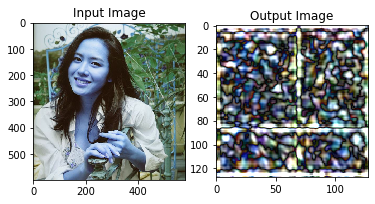

In [32]:
# Read image
img = cv2.imread("4.jpg")
H, W, C = img.shape

# Gray scale
gray = bgr2gray(img)

# DFT
G = dft(img)

# BPF
G = bpf(G, ratio1=0.1, ratio2=0.5)

# IDFT
out = idft(G)

plt.subplot(121),plt.imshow(img ,cmap='gray')
plt.title('Input Image')
plt.subplot(122),plt.imshow(out ,cmap='gray')
plt.title('Output Image')
plt.show()

* **step2. JPEG压缩DCT +量化**

量化DCT系数并用IDCT恢复。还要比较当时的图像容量。

量化DCT系数是用于编码为jpeg图像的技术。

量化是对每个预定片段的值进行近似取整的操作，并且是类似于下限，上限，下限等的计算。

在JPEG图像中，DCT系数根据以下所示的量化表进行量化。该量化表取自jpeg组织的规范。在量化中，将8x8系数除以Q并四舍五入。之后，乘以Q。IDCT使用所有系数。

> 由于执行速度较慢, 就使用一张图片测试

In [33]:
# DCT hyoer-parameter
T = 8
K = 4
channel = 3

# DCT weight
def DCT_w(x, y, u, v):
    cu = 1.
    cv = 1.
    if u == 0:
        cu /= np.sqrt(2)
    if v == 0:
        cv /= np.sqrt(2)
    theta = np.pi / (2 * T)
    return (( 2 * cu * cv / T) * np.cos((2*x+1)*u*theta) * np.cos((2*y+1)*v*theta))

# DCT
def dct(img):
    H, W, _ = img.shape

    F = np.zeros((H, W, channel), dtype=np.float32)

    for c in range(channel):
        for yi in range(0, H, T):
            for xi in range(0, W, T):
                for v in range(T):
                    for u in range(T):
                        for y in range(T):
                            for x in range(T):
                                F[v+yi, u+xi, c] += img[y+yi, x+xi, c] * DCT_w(x,y,u,v)

    return F


# IDCT
def idct(F):
    H, W, _ = F.shape

    out = np.zeros((H, W, channel), dtype=np.float32)

    for c in range(channel):
        for yi in range(0, H, T):
            for xi in range(0, W, T):
                for y in range(T):
                    for x in range(T):
                        for v in range(K):
                            for u in range(K):
                                out[y+yi, x+xi, c] += F[v+yi, u+xi, c] * DCT_w(x,y,u,v)

    out = np.clip(out, 0, 255)
    out = np.round(out).astype(np.uint8)

    return out

# Quantization
def quantization(F):
    H, W, _ = F.shape

    Q = np.array(((16, 11, 10, 16, 24, 40, 51, 61),
                (12, 12, 14, 19, 26, 58, 60, 55),
                (14, 13, 16, 24, 40, 57, 69, 56),
                (14, 17, 22, 29, 51, 87, 80, 62),
                (18, 22, 37, 56, 68, 109, 103, 77),
                (24, 35, 55, 64, 81, 104, 113, 92),
                (49, 64, 78, 87, 103, 121, 120, 101),
                (72, 92, 95, 98, 112, 100, 103, 99)), dtype=np.float32)

    for ys in range(0, H, T):
        for xs in range(0, W, T):
            for c in range(channel):
                F[ys: ys + T, xs: xs + T, c] =  np.round(F[ys: ys + T, xs: xs + T, c] / Q) * Q

    return F



# MSE
def MSE(img1, img2):
    H, W, _ = img1.shape
    mse = np.sum((img1 - img2) ** 2) / (H * W * channel)
    return mse

# PSNR
def PSNR(mse, vmax=255):
    return 10 * np.log10(vmax * vmax / mse)

# bitrate
def BITRATE():
    return 1. * T * K * K / T / T


In [34]:

# Read image
img = cv2.imread("2.jpg")

# DCT
F = dct(img)

# quantization
F = quantization(F)

# IDCT
out = idct(F)

# MSE
mse = MSE(img, out)

# PSNR
psnr = PSNR(mse)

# bitrate
bitrate = BITRATE()

print("MSE:", mse)
print("PSNR:", psnr)
print("bitrate:", bitrate)

MSE: 10.606733957926432
PSNR: 37.87498685016473
bitrate: 2.0


In [35]:
cv2.waitKey(0)
cv2.imwrite("out.jpg", out)

True

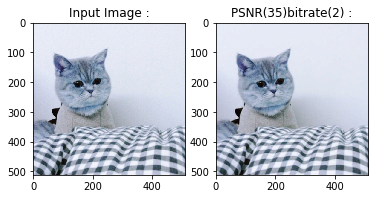

In [36]:
plt.subplot(121),plt.imshow(img ,cmap='gray')
plt.title('Input Image :')
plt.subplot(122),plt.imshow(out ,cmap='gray')
plt.title('PSNR(35)bitrate(2) :')
plt.show()


* **step3.JPEG 压缩——第三步：YCbCr 色彩空间**
在YCbCr颜色形式中，通过将Y乘以0.7来加深对比度。

YCbCr彩色系统是一种将图像分解为代表亮度的Y，亮度和蓝色电平之间的差Cb以及亮度和红色电平之间的Cr的表达方法。

在JPEG转换中使用。

从RGB到YCbCr的转换如下。

$$
Y = 0.299 * R + 0.5870 * G + 0.114 * B \\
Cb = -0.1687 * R - 0.3313 * G + 0.5 * B + 128 \\\
Cr = 0.5 * R - 0.4187 * G - 0.0813 * B + 128
$$
从YCbCr到RGB的转换如下。
$$
R = Y + (Cr - 128) * 1.402\\
G = Y - (Cb - 128) * 0.3441 - (Cr - 128) * 0.7139\\\
B = Y + (Cb - 128) * 1.7718
$$

In [37]:
channel = 3

# BGR -> Y Cb Cr
def BGR2YCbCr(img):
    H, W, _ = img.shape

    ycbcr = np.zeros([H, W, 3], dtype=np.float32)

    ycbcr[..., 0] = 0.2990 * img[..., 2] + 0.5870 * img[..., 1] + 0.1140 * img[..., 0]
    ycbcr[..., 1] = -0.1687 * img[..., 2] - 0.3313 * img[..., 1] + 0.5 * img[..., 0] + 128.
    ycbcr[..., 2] = 0.5 * img[..., 2] - 0.4187 * img[..., 1] - 0.0813 * img[..., 0] + 128.

    return ycbcr

# Y Cb Cr -> BGR
def YCbCr2BGR(ycbcr):
    H, W, _ = ycbcr.shape

    out = np.zeros([H, W, channel], dtype=np.float32)
    out[..., 2] = ycbcr[..., 0] + (ycbcr[..., 2] - 128.) * 1.4020
    out[..., 1] = ycbcr[..., 0] - (ycbcr[..., 1] - 128.) * 0.3441 - (ycbcr[..., 2] - 128.) * 0.7139
    out[..., 0] = ycbcr[..., 0] + (ycbcr[..., 1] - 128.) * 1.7718

    out = np.clip(out, 0, 255)
    out = out.astype(np.uint8)

    return out


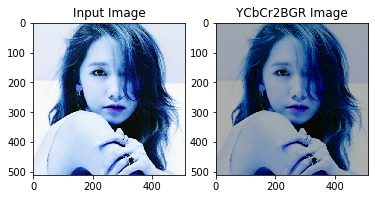

In [38]:
# Read image
img = cv2.imread("7.jpg")

# bgr -> Y Cb Cr
ycbcr = BGR2YCbCr(img)

# process
ycbcr[..., 0] *= 0.7

# YCbCr > RGB
out = YCbCr2BGR(ycbcr)

plt.subplot(121),plt.imshow(img ,cmap='gray')
plt.title('Input Image')
plt.subplot(122),plt.imshow(out ,cmap='gray')
plt.title('YCbCr2BGR Image')
plt.show()

In [39]:
cv2.waitKey(0)
cv2.imwrite("7out.jpg", out)

True

* **step4.PEG压缩YCbCr + DCT +量化**

更改为YCbCr色彩系统DCT，使用量化表Q1，Q2量化Y，使用Q2量化Cb和Cr，并使用IDCT恢复图像。同时比较图像容量。


    1.将RGB转换为YCbCr
    2.YCbCr转DCT
    3.量化DCT
    4.量化IDCT
    5.将IDCT YCbCr转换为RGB

In [40]:
# DCT hyoer-parameter
T = 8
K = 8
channel = 3


# BGR -> Y Cb Cr
def BGR2YCbCr(img):
    H, W, _ = img.shape

    ycbcr = np.zeros([H, W, 3], dtype=np.float32)

    ycbcr[..., 0] = 0.2990 * img[..., 2] + 0.5870 * img[..., 1] + 0.1140 * img[..., 0]
    ycbcr[..., 1] = -0.1687 * img[..., 2] - 0.3313 * img[..., 1] + 0.5 * img[..., 0] + 128.
    ycbcr[..., 2] = 0.5 * img[..., 2] - 0.4187 * img[..., 1] - 0.0813 * img[..., 0] + 128.

    return ycbcr

# Y Cb Cr -> BGR
def YCbCr2BGR(ycbcr):
    H, W, _ = ycbcr.shape

    out = np.zeros([H, W, channel], dtype=np.float32)
    out[..., 2] = ycbcr[..., 0] + (ycbcr[..., 2] - 128.) * 1.4020
    out[..., 1] = ycbcr[..., 0] - (ycbcr[..., 1] - 128.) * 0.3441 - (ycbcr[..., 2] - 128.) * 0.7139
    out[..., 0] = ycbcr[..., 0] + (ycbcr[..., 1] - 128.) * 1.7718

    out = np.clip(out, 0, 255)
    out = out.astype(np.uint8)

    return out


# DCT weight
def DCT_w(x, y, u, v):
    cu = 1.
    cv = 1.
    if u == 0:
        cu /= np.sqrt(2)
    if v == 0:
        cv /= np.sqrt(2)
    theta = np.pi / (2 * T)
    return (( 2 * cu * cv / T) * np.cos((2*x+1)*u*theta) * np.cos((2*y+1)*v*theta))

# DCT
def dct(img):
    H, W, _ = img.shape
    F = np.zeros((H, W, channel), dtype=np.float32)

    for c in range(channel):
        for yi in range(0, H, T):
            for xi in range(0, W, T):
                for v in range(T):
                    for u in range(T):
                        for y in range(T):
                            for x in range(T):
                                F[v+yi, u+xi, c] += img[y+yi, x+xi, c] * DCT_w(x,y,u,v)

    return F


# IDCT
def idct(F):
    H, W, _ = F.shape

    out = np.zeros((H, W, channel), dtype=np.float32)

    for c in range(channel):
        for yi in range(0, H, T):
            for xi in range(0, W, T):
                for y in range(T):
                    for x in range(T):
                        for v in range(K):
                            for u in range(K):
                                out[y+yi, x+xi, c] += F[v+yi, u+xi, c] * DCT_w(x,y,u,v)

    out = np.clip(out, 0, 255)
    out = np.round(out).astype(np.uint8)

    return out

# Quantization
def quantization(F):
    H, W, _ = F.shape

    Q = np.array(((16, 11, 10, 16, 24, 40, 51, 61),
                (12, 12, 14, 19, 26, 58, 60, 55),
                (14, 13, 16, 24, 40, 57, 69, 56),
                (14, 17, 22, 29, 51, 87, 80, 62),
                (18, 22, 37, 56, 68, 109, 103, 77),
                (24, 35, 55, 64, 81, 104, 113, 92),
                (49, 64, 78, 87, 103, 121, 120, 101),
                (72, 92, 95, 98, 112, 100, 103, 99)), dtype=np.float32)

    for ys in range(0, H, T):
        for xs in range(0, W, T):
            for c in range(channel):
                F[ys: ys + T, xs: xs + T, c] =  np.round(F[ys: ys + T, xs: xs + T, c] / Q) * Q

    return F


# JPEG without Hufman coding
def JPEG(img):
    # BGR -> Y Cb Cr
    ycbcr = BGR2YCbCr(img)

    # DCT
    F = dct(ycbcr)

    # quantization
    F = quantization(F)

    # IDCT
    ycbcr = idct(F)

    # Y Cb Cr -> BGR
    out = YCbCr2BGR(ycbcr)

    return out


# MSE
def MSE(img1, img2):
    H, W, _ = img1.shape
    mse = np.sum((img1 - img2) ** 2) / (H * W * channel)
    return mse

# PSNR
def PSNR(mse, vmax=255):
    return 10 * np.log10(vmax * vmax / mse)

# bitrate
def BITRATE():
    return 1. * T * K * K / T / T


In [41]:
# Read image
img = cv2.imread("2.jpg")

# JPEG
out = JPEG(img)

# MSE
mse = MSE(img, out)

# PSNR
psnr = PSNR(mse)

# bitrate
bitrate = BITRATE()

print("MSE:", mse)
print("PSNR:", psnr)
print("bitrate:", bitrate)


MSE: 10.638548533121744
PSNR: 37.8619798169231
bitrate: 8.0


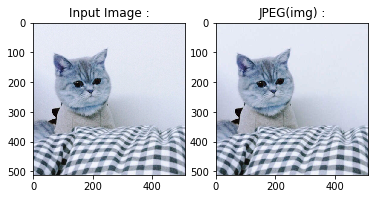

In [42]:
plt.subplot(121),plt.imshow(img ,cmap='gray')
plt.title('Input Image :')
plt.subplot(122),plt.imshow(out ,cmap='gray')
plt.title('JPEG(img) :')
plt.show()



In [43]:
cv2.waitKey(0)
cv2.imwrite("out.jpg", out)

True